In [1]:
# Imports
# !pip install torchinfo
import torch
import torch.nn as nn
import torch.utils.data as Data
from torchvision import datasets, transforms
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time
import CompMethods_V2 as TP
import DataSetting_v2 as DS

### Loader

In [2]:
gpu = 7
date = '240513'
#run = ['30', '100', '300', '900']
run= '30'

In [6]:
transform = transforms.Compose([
    transforms.Resize([128, 128]),
    transforms.ToTensor()])
datadir = f'../dataset/0509/make19_{run}/'
#dataplanner = DS.DataPlanner(datadir)
#dataplanner.load_raw()
train_data = dataplanner.regroup({'T01', 'T02'})
test_data = dataplanner.regroup({'T03', 'T04'})
train_dataset = DS.MyDataset('tv', train_data, transform=transform)
test_dataset = DS.MyDataset('test', test_data, transform=transform)
train_loader, valid_loader = DS.DataSplitter(train_dataset).split_loader()
test_loader = DS.DataSplitter(test_dataset, 1).gen_loader()

Regrouping...


  0%|          | 0/10 [00:00<?, ?it/s]

T02 tag len=29 
T01 tag len=77 
T02 depth len=29 
T01 depth len=77 
T02 csi len=29 
T01 csi len=77 
T02 center len=29 
T01 center len=77 
T02 pd len=29 
T01 pd len=77 
T02 cimg len=29 
T01 cimg len=77 
T02 bbx len=29 
T01 bbx len=77 
T02 time len=29 
T01 time len=77 
T02 ind len=29 
T01 ind len=77 
T02 rimg len=29 
T01 rimg len=77 
Regrouping...


  0%|          | 0/10 [00:00<?, ?it/s]

T03 tag len=36 
T04 tag len=57 
T03 depth len=36 
T04 depth len=57 
T03 csi len=36 
T04 csi len=57 
T03 center len=36 
T04 center len=57 
T03 pd len=36 
T04 pd len=57 
T03 cimg len=36 
T04 cimg len=57 
T03 bbx len=36 
T04 bbx len=57 
T03 time len=36 
T04 time len=57 
T03 ind len=36 
T04 ind len=57 
T03 rimg len=36 
T04 rimg len=57 
Generating loaders...
 tv len 5490
 exported train loader of len 68, batch size 64
 exported valid loader of len 17, batch size 64

Generating loaders...
 test len 5069
 exported loader of len 5069, batch size 1


### Wi2Vi

In [3]:
transform = transforms.Compose([
    transforms.Resize([240, 320]),
    transforms.ToTensor()])
datadir = f'../dataset/0509/make19_{run}/'
dataplanner = DS.DataPlanner(datadir)
dataplanner.load_raw()
train_data = dataplanner.regroup(('T01', 'T02'))
test_data = dataplanner.regroup(('T03', 'T04'))
train_dataset = DS.MyDataset('tv', train_data, transform=transform)
test_dataset = DS.MyDataset('test', test_data, transform=transform)
train_loader, valid_loader = DS.DataSplitter(train_dataset).split_loader()
test_loader = DS.DataSplitter(test_dataset, 1).gen_loader()

Loading dataset...


  0%|          | 0/1213 [00:00<?, ?it/s]

Regrouping...


  0%|          | 0/10 [00:00<?, ?it/s]

Take1 tag len=48 
Take2 tag len=77 
Take1 depth len=48 
Take2 depth len=77 
Take1 csi len=48 
Take2 csi len=77 
Take1 center len=48 
Take2 center len=77 
Take1 pd len=48 
Take2 pd len=77 
Take1 cimg len=48 
Take2 cimg len=77 
Take1 bbx len=48 
Take2 bbx len=77 
Take1 time len=48 
Take2 time len=77 
Take1 ind len=48 
Take2 ind len=77 
Take1 rimg len=48 
Take2 rimg len=77 
Regrouping...


  0%|          | 0/10 [00:00<?, ?it/s]

Take3 tag len=36 
Take4 tag len=57 
Take3 depth len=36 
Take4 depth len=57 
Take3 csi len=36 
Take4 csi len=57 
Take3 center len=36 
Take4 center len=57 
Take3 pd len=36 
Take4 pd len=57 
Take3 cimg len=36 
Take4 cimg len=57 
Take3 bbx len=36 
Take4 bbx len=57 
Take3 time len=36 
Take4 time len=57 
Take3 ind len=36 
Take4 ind len=57 
Take3 rimg len=36 
Take4 rimg len=57 
Generating loaders...
 tv len 5490
 exported train loader of len 68, batch size 64
 exported valid loader of len 17, batch size 64

Generating loaders...
 test len 5069
 exported loader of len 5069, batch size 1


In [6]:
for data in train_loader:
    print(data['rimg'][0].shape)
    break

torch.Size([1, 128, 226])


In [4]:
# Model and Loss
wi2vi = TP.Wi2Vi()
torch.cuda.set_device(gpu)

Wi2Vi_trainer = TP.CompTrainer(name='Wi2Vi', mask=False,
                              networks=[wi2vi],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=f'{date}_{run}Wi2Vi')

In [5]:
# Training and Testing
%matplotlib inline
wi2vi_trained = schedule(Wi2Vi_trainer, notion=f'{date}_{run}Wi2Vi')

/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([64, 1, 128, 226])) that is different to the input size (torch.Size([64, 1, 240, 320])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (320) must match the size of tensor b (226) at non-singleton dimension 3

### AutoEncoder

In [13]:
torch.cuda.set_device(gpu)
ae = TP.AutoEncoder(latent_dim=16)
AE_trainer = TP.CompTrainer(name='AE', mode='ae', mask=True,
                            networks=[ae],
                            lr=1e-4, epochs=10, cuda=gpu,
                            train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=f'{date}_{run}AE')

AE train: epoch=1/999, batch=0/68, loss=0.0389, current best valid loss=0.0920    
AE train: epoch=1/999, batch=5/68, loss=0.0502, current best valid loss=0.0920    
AE train: epoch=1/999, batch=10/68, loss=0.0421, current best valid loss=0.0920    
AE train: epoch=1/999, batch=15/68, loss=0.0481, current best valid loss=0.0920    
AE train: epoch=1/999, batch=20/68, loss=0.0478, current best valid loss=0.0920    
AE train: epoch=1/999, batch=25/68, loss=0.0456, current best valid loss=0.0920    
AE train: epoch=1/999, batch=30/68, loss=0.0490, current best valid loss=0.0920    
AE train: epoch=1/999, batch=35/68, loss=0.0386, current best valid loss=0.0920    
AE train: epoch=1/999, batch=40/68, loss=0.0421, current best valid loss=0.0920    
AE train: epoch=1/999, batch=45/68, loss=0.0430, current best valid loss=0.0920    
AE train: epoch=1/999, batch=50/68, loss=0.0409, current best valid loss=0.0920    
AE train: epoch=1/999, batch=55/68, loss=0.0404, current best valid loss=0.092

<Figure size 432x288 with 0 Axes>

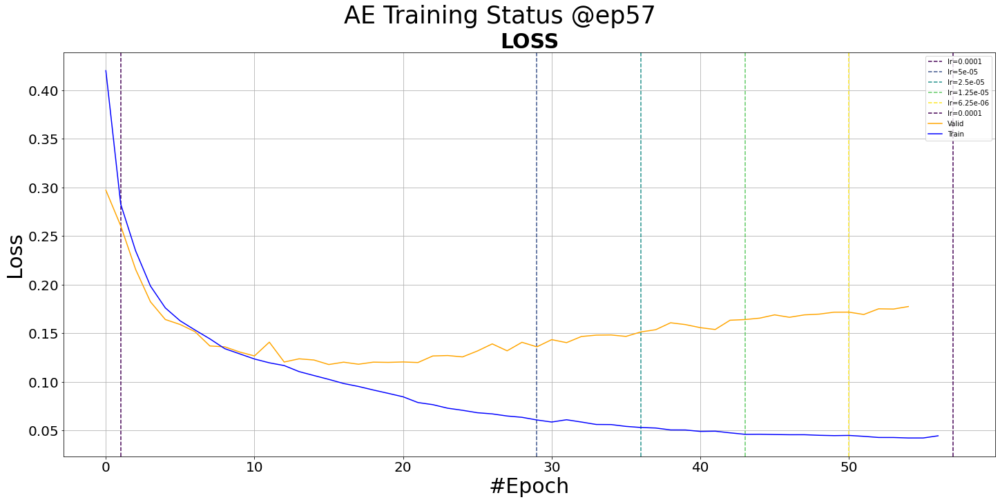

AE test: sample=5065/5069, loss=0.4081    
Test finished. Average loss={'LOSS': 0.7184527460651053}

Total training time: 41.41390776634216 sec


<Figure size 1440x720 with 0 Axes>

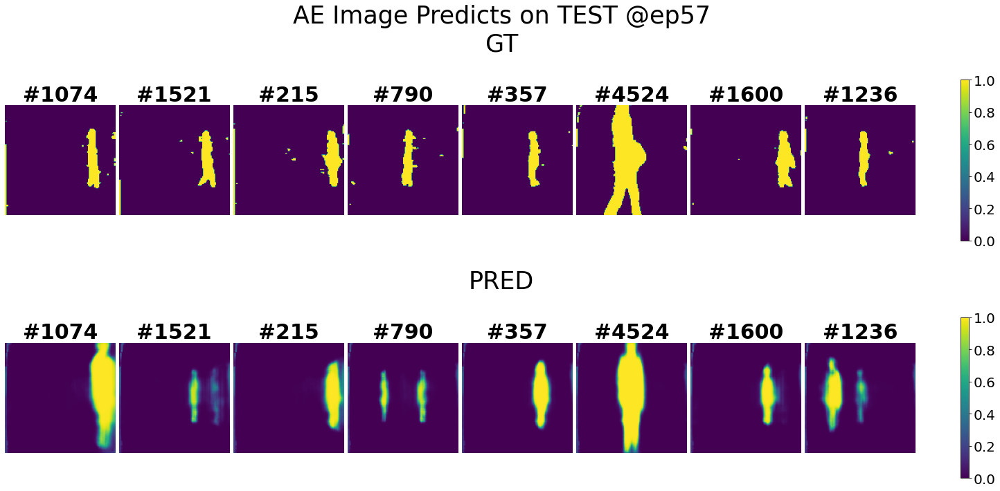

<Figure size 1440x720 with 0 Axes>

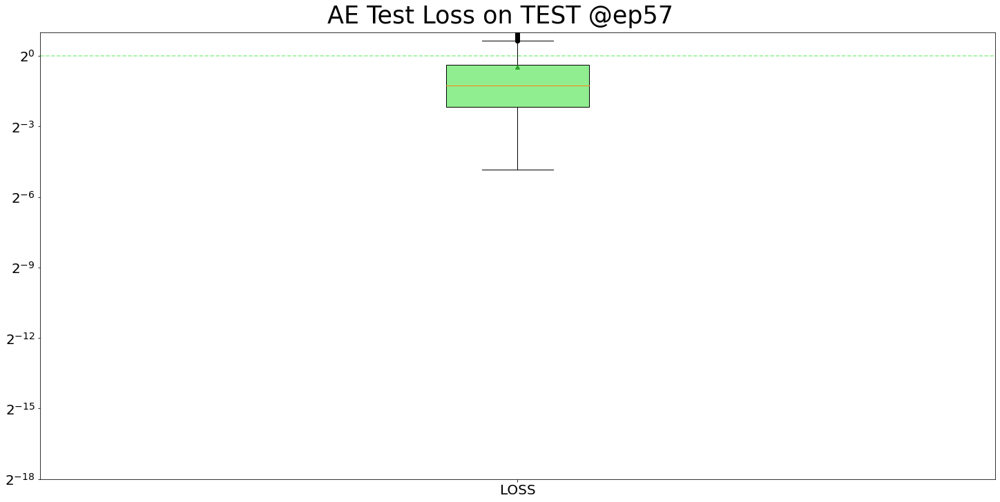

<Figure size 1440x720 with 0 Axes>

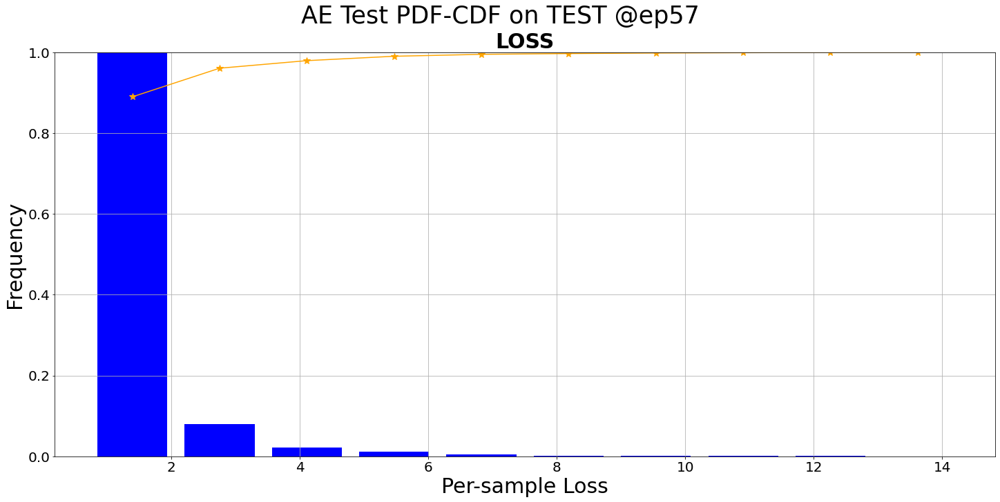

<Figure size 1440x720 with 0 Axes>

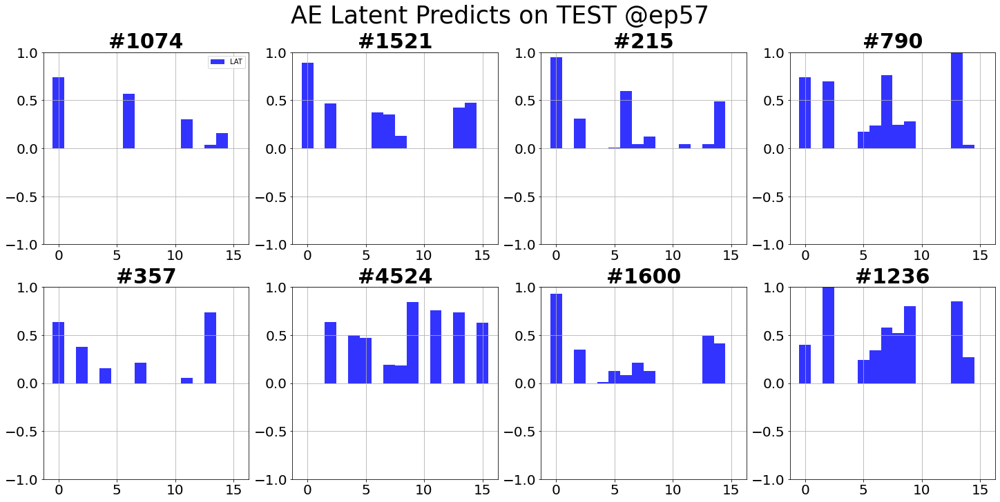

AE test: sample=5065/5069, loss=0.4280     
Test finished. Average loss={'LOSS': 0.7184527465560293}

Total training time: 40.7697057723999 sec


<Figure size 1440x720 with 0 Axes>

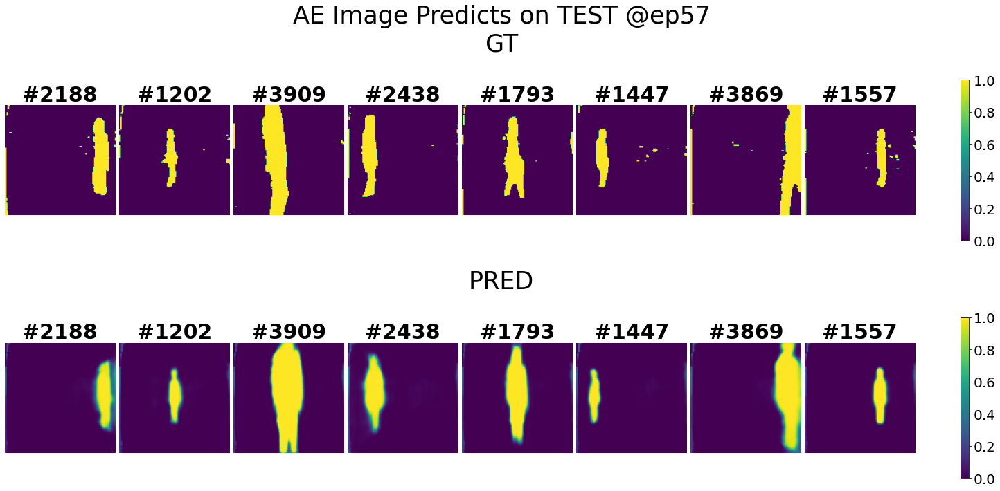

<Figure size 1440x720 with 0 Axes>

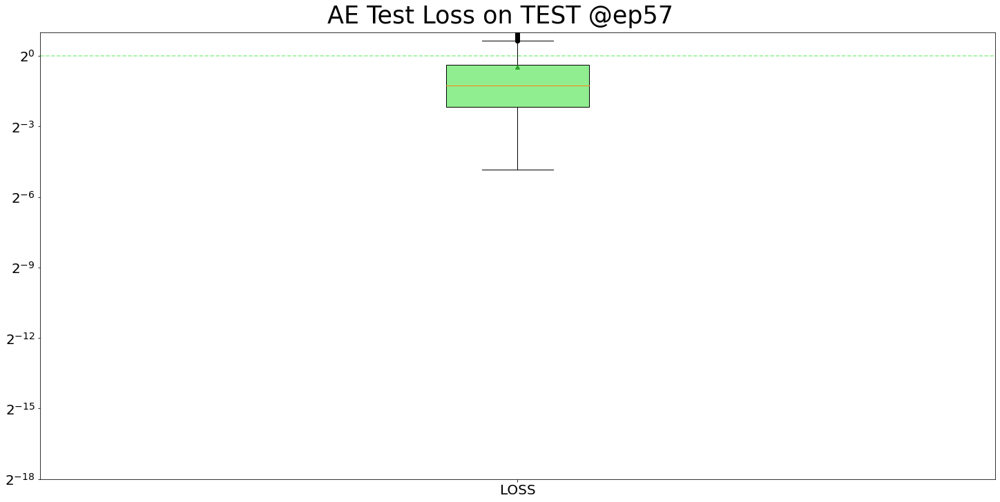

<Figure size 1440x720 with 0 Axes>

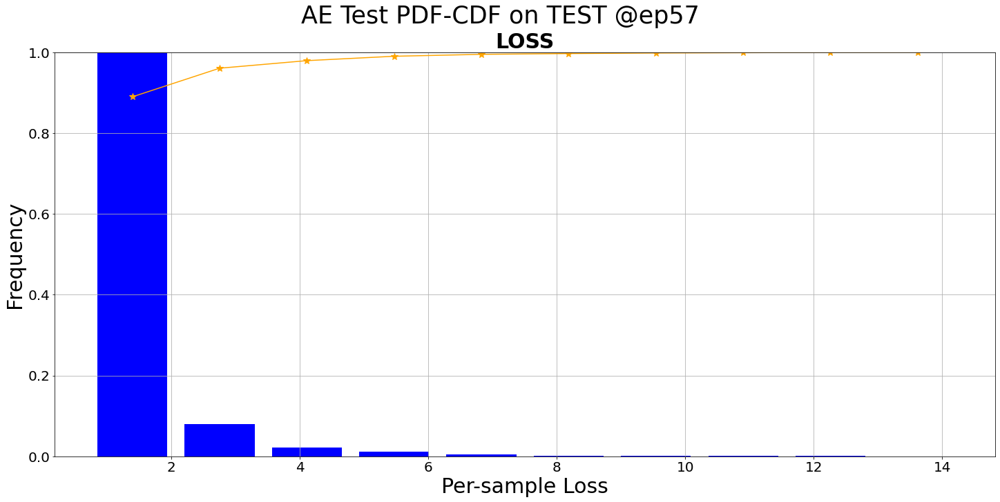

<Figure size 1440x720 with 0 Axes>

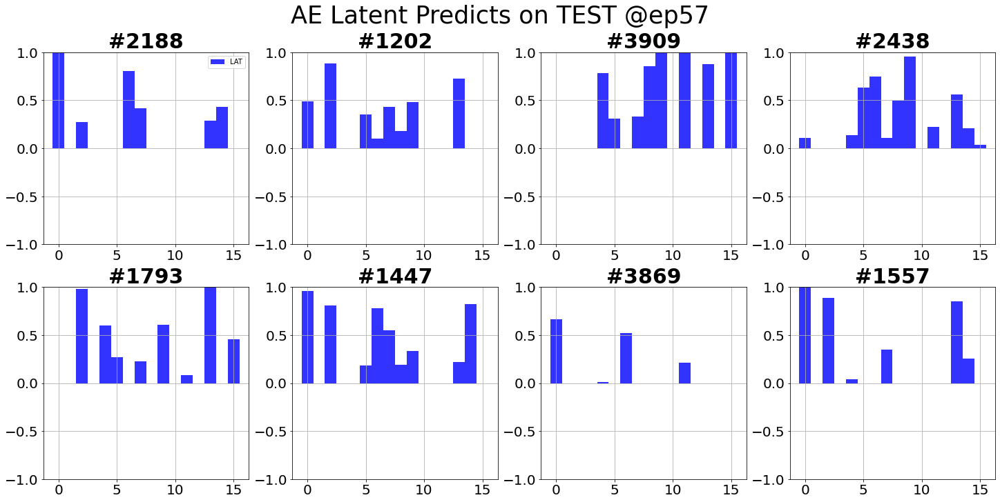

Saving pred including GT, PRED, LAT, IND, TAG...Done

AE schedule Completed!


In [16]:
# Training and Testing
%matplotlib inline
AE_trainer.lr = 1e-4
ae_trained = AE_trainer.schedule()

### VAE

In [31]:
torch.cuda.set_device(gpu)
imgdecoder = TP.ImageDecoder(latent_dim=16)
csiencoder = TP.CSIEncoder(out_length=32)
VAE_trainer = TP.CompTrainer(name='VAE', mode='vae', mask=False,
                              networks=[csiencoder, imgdecoder],
                 lr=1e-3, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=f'{date}_{run}VAE')

VAE train: epoch=1/999, batch=0/68, loss=0.1899, current best valid loss=inf    
VAE train: epoch=1/999, batch=5/68, loss=0.4139, current best valid loss=inf    
VAE train: epoch=1/999, batch=10/68, loss=0.0817, current best valid loss=inf    
VAE train: epoch=1/999, batch=15/68, loss=0.0146, current best valid loss=inf    
VAE train: epoch=1/999, batch=20/68, loss=0.0109, current best valid loss=inf    
VAE train: epoch=1/999, batch=25/68, loss=0.0051, current best valid loss=inf    
VAE train: epoch=1/999, batch=30/68, loss=0.0062, current best valid loss=inf    
VAE train: epoch=1/999, batch=35/68, loss=0.0054, current best valid loss=inf    
VAE train: epoch=1/999, batch=40/68, loss=0.0019, current best valid loss=inf    
VAE train: epoch=1/999, batch=45/68, loss=0.0015, current best valid loss=inf    
VAE train: epoch=1/999, batch=50/68, loss=0.0012, current best valid loss=inf    
VAE train: epoch=1/999, batch=55/68, loss=0.0011, current best valid loss=inf    
VAE train: epoch=1

<Figure size 432x288 with 0 Axes>

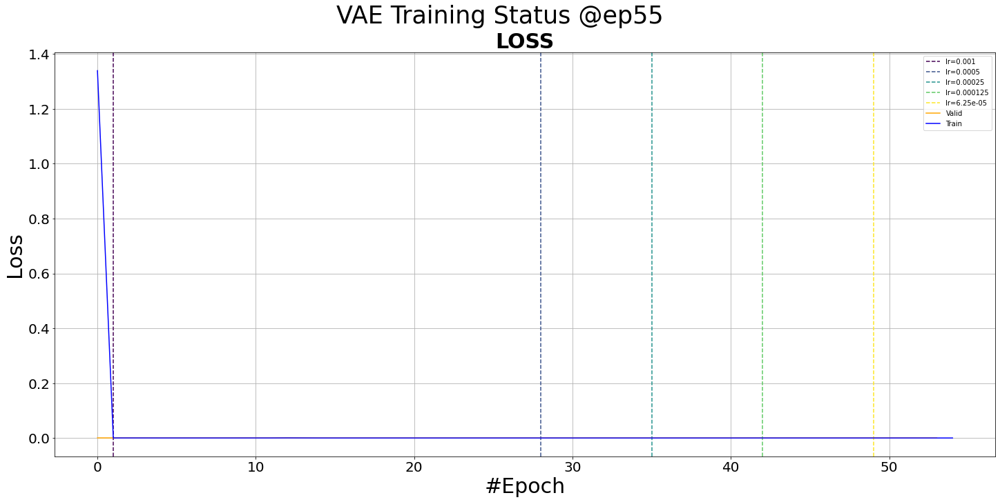

VAE test: sample=5065/5069, loss=0.0321    
Test finished. Average loss={'LOSS': 0.033509969829441495}

Total training time: 42.05556607246399 sec


<Figure size 1440x720 with 0 Axes>

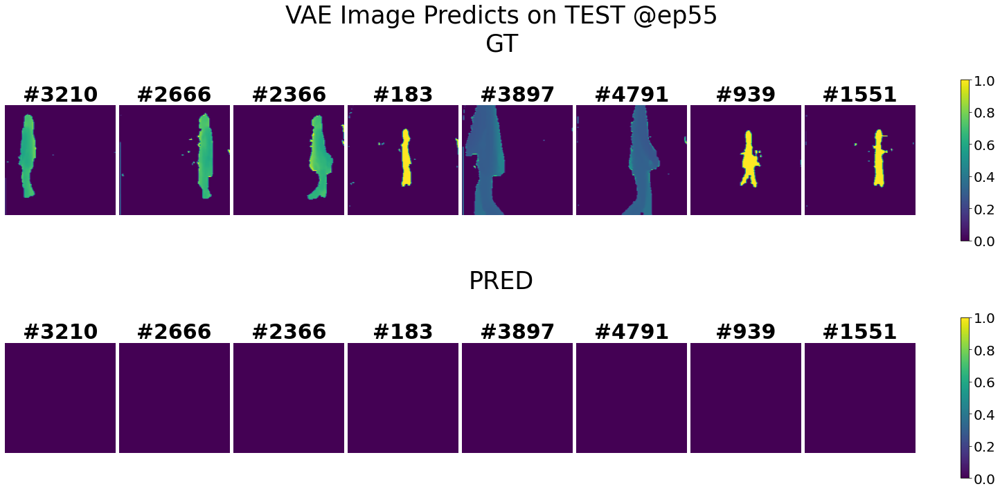

<Figure size 1440x720 with 0 Axes>

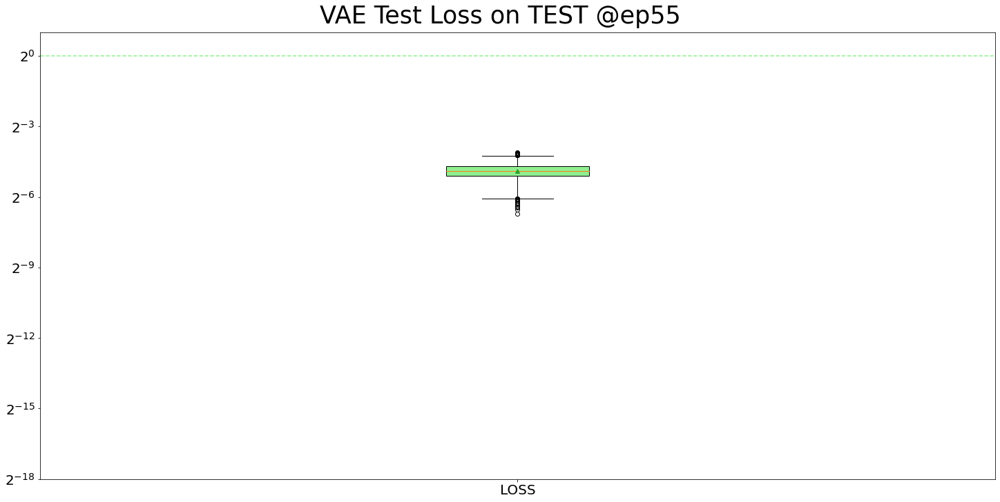

<Figure size 1440x720 with 0 Axes>

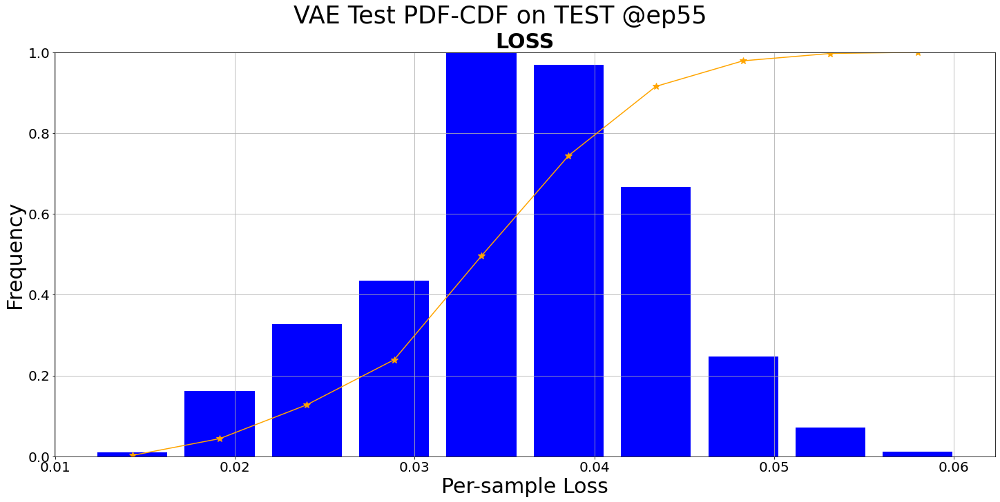

<Figure size 1440x720 with 0 Axes>

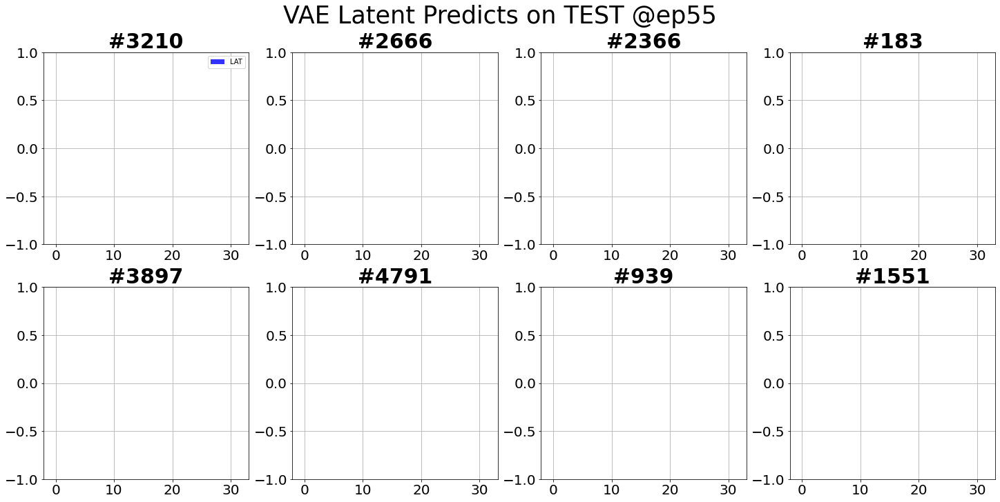

VAE test: sample=5065/5069, loss=0.0262    
Test finished. Average loss={'LOSS': 0.033509969829441495}

Total training time: 43.0194673538208 sec


<Figure size 1440x720 with 0 Axes>

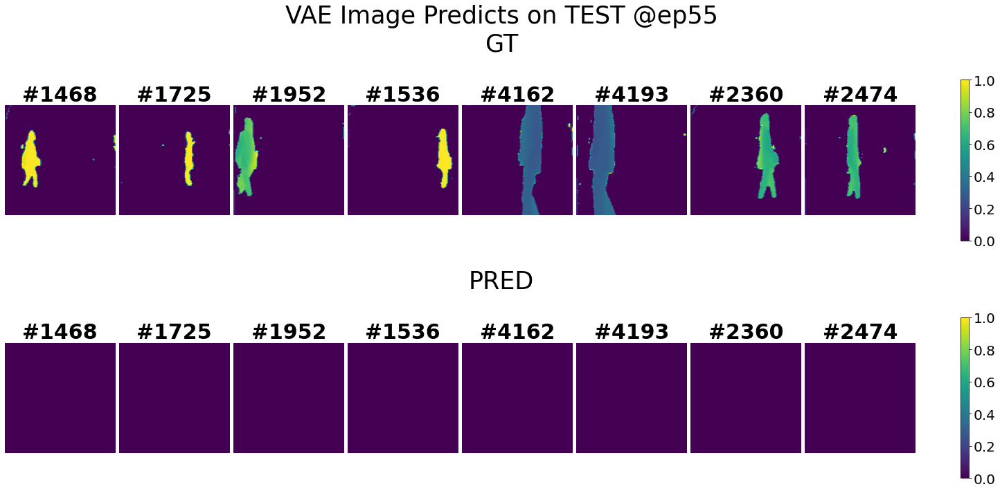

<Figure size 1440x720 with 0 Axes>

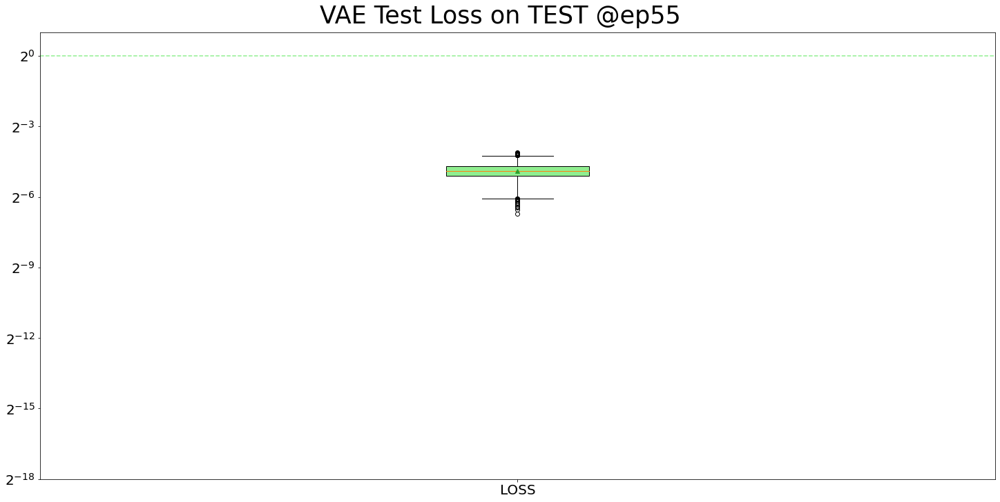

<Figure size 1440x720 with 0 Axes>

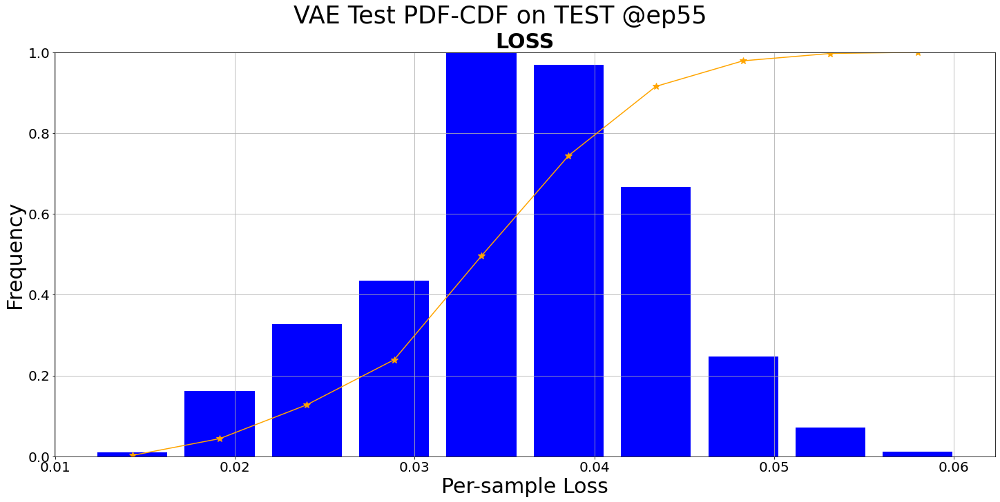

<Figure size 1440x720 with 0 Axes>

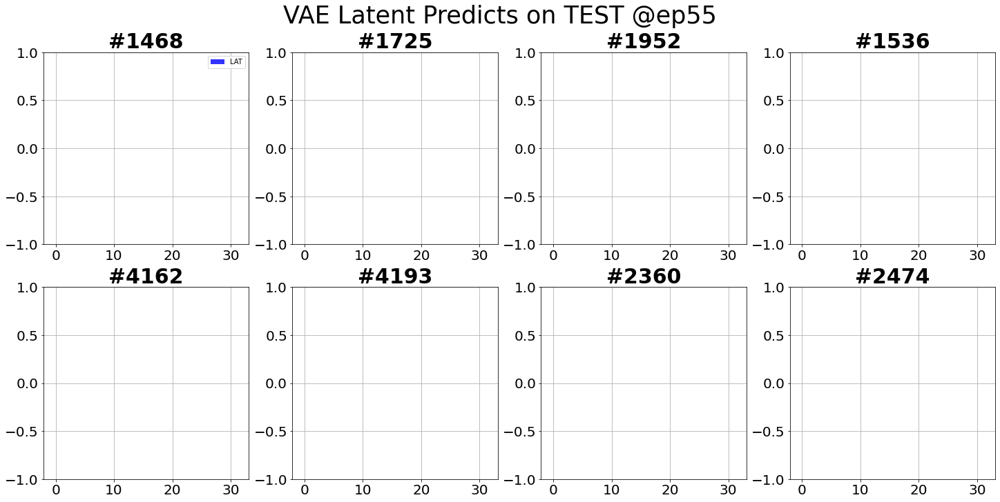

Saving pred including GT, PRED, LAT, IND, TAG...Done

VAE schedule Completed!


In [32]:
# Training and Testing
%matplotlib inline
vae_trained = VAE_trainer.schedule()

### Teacher-Student AE

#### Teacher

In [57]:
torch.cuda.set_device(gpu)
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)
TSAE_T_trainer = TP.CompTrainer(name='Teacher', mode='ae_t', mask=False,
                              networks=[imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=f'{date}_{run}TSAE')

Teacher train: epoch=1/999, batch=0/68, loss=0.2664, current best valid loss=inf    
Teacher train: epoch=1/999, batch=5/68, loss=0.2636, current best valid loss=inf    
Teacher train: epoch=1/999, batch=10/68, loss=0.2526, current best valid loss=inf    
Teacher train: epoch=1/999, batch=15/68, loss=0.1857, current best valid loss=inf    
Teacher train: epoch=1/999, batch=20/68, loss=0.0472, current best valid loss=inf    
Teacher train: epoch=1/999, batch=25/68, loss=0.0420, current best valid loss=inf    
Teacher train: epoch=1/999, batch=30/68, loss=0.0410, current best valid loss=inf    
Teacher train: epoch=1/999, batch=35/68, loss=0.0424, current best valid loss=inf    
Teacher train: epoch=1/999, batch=40/68, loss=0.0398, current best valid loss=inf    
Teacher train: epoch=1/999, batch=45/68, loss=0.0411, current best valid loss=inf    
Teacher train: epoch=1/999, batch=50/68, loss=0.0429, current best valid loss=inf    
Teacher train: epoch=1/999, batch=55/68, loss=0.0401, cu

<Figure size 432x288 with 0 Axes>

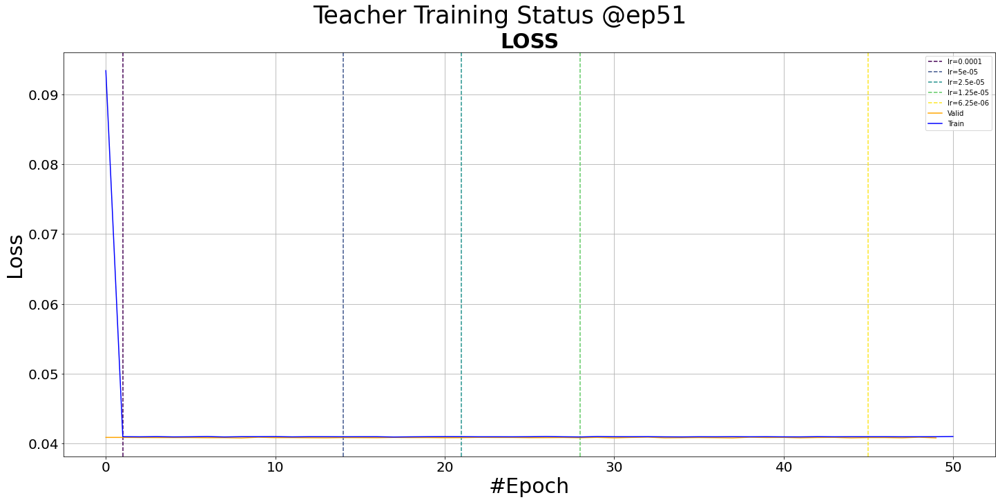

Teacher test: sample=5065/5069, loss=0.0465    
Test finished. Average loss={'LOSS': 0.03350965700427011}

Total training time: 45.05540156364441 sec


<Figure size 1440x720 with 0 Axes>

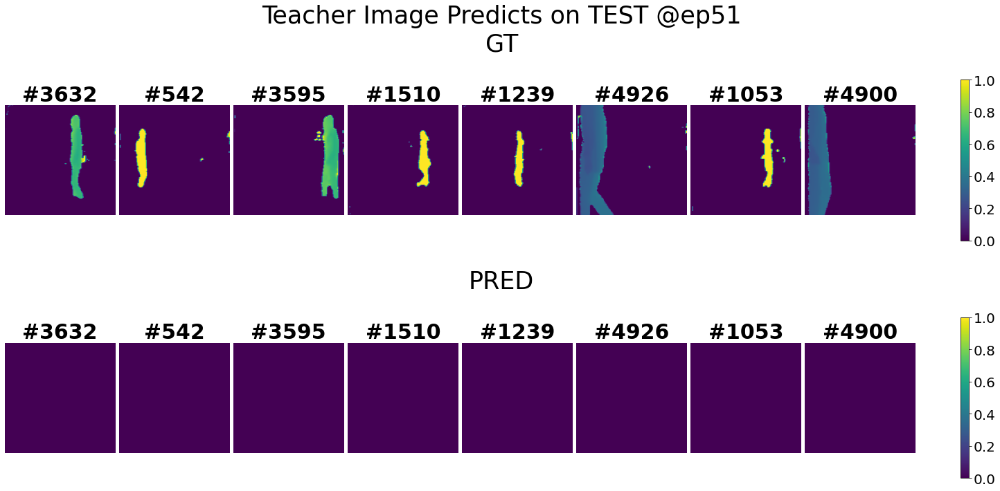

<Figure size 1440x720 with 0 Axes>

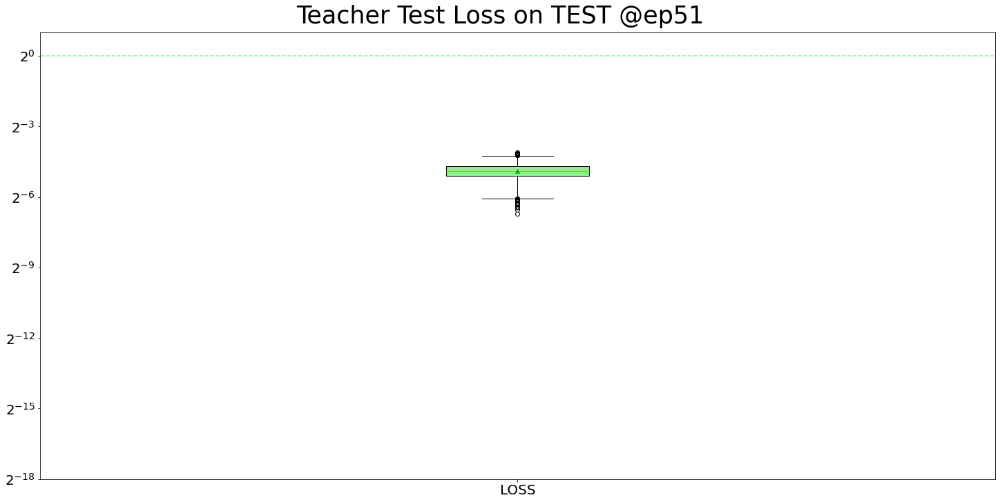

<Figure size 1440x720 with 0 Axes>

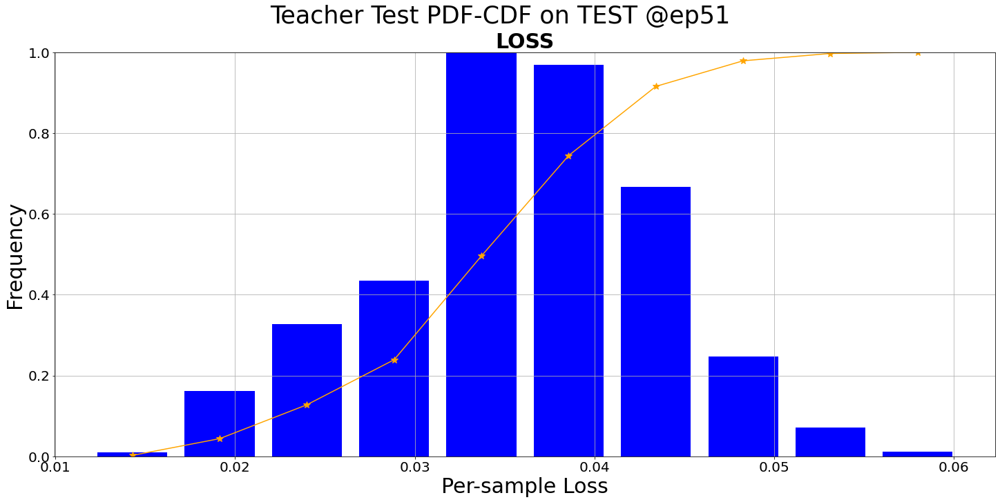

<Figure size 1440x720 with 0 Axes>

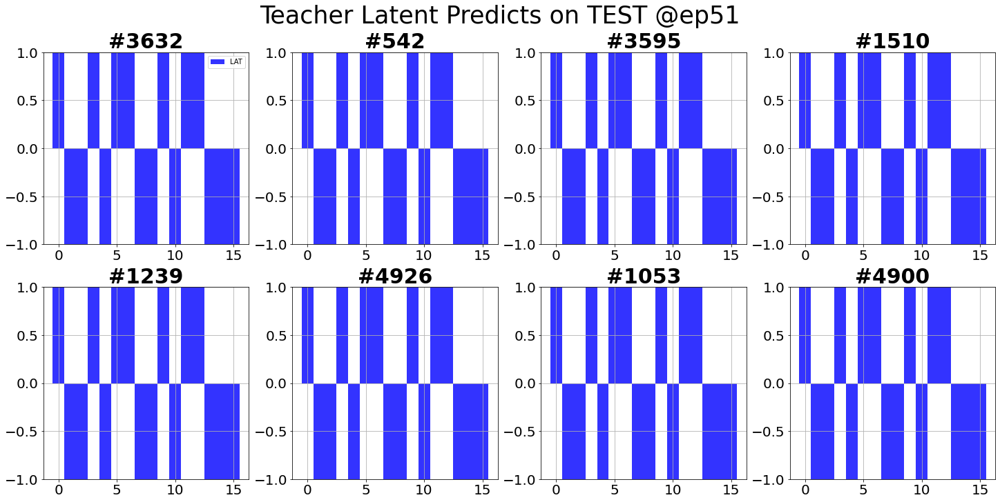

Teacher test: sample=5065/5069, loss=0.0314    
Test finished. Average loss={'LOSS': 0.03350965700427011}

Total training time: 44.410093545913696 sec


<Figure size 1440x720 with 0 Axes>

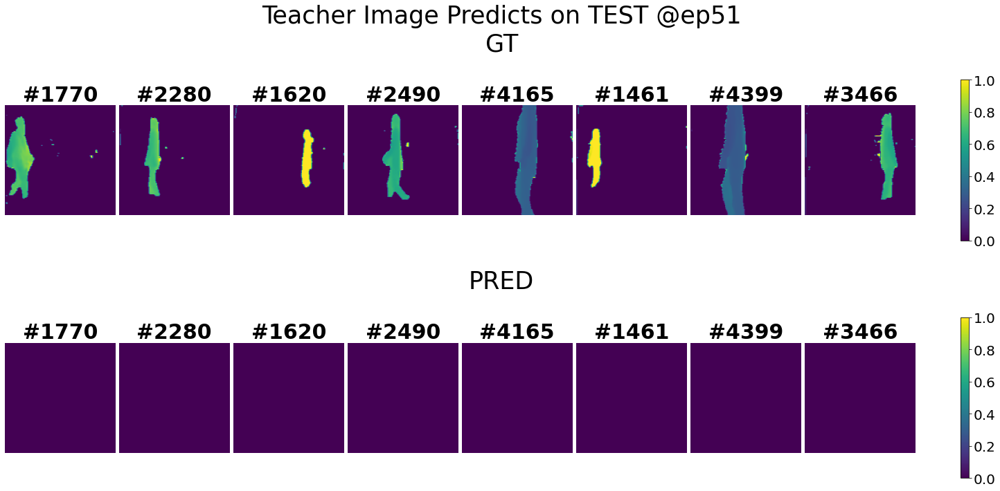

<Figure size 1440x720 with 0 Axes>

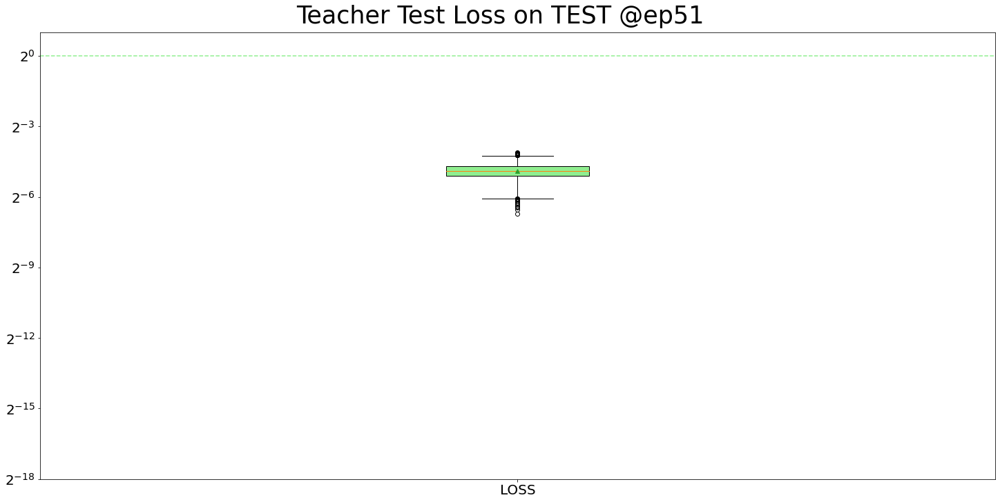

<Figure size 1440x720 with 0 Axes>

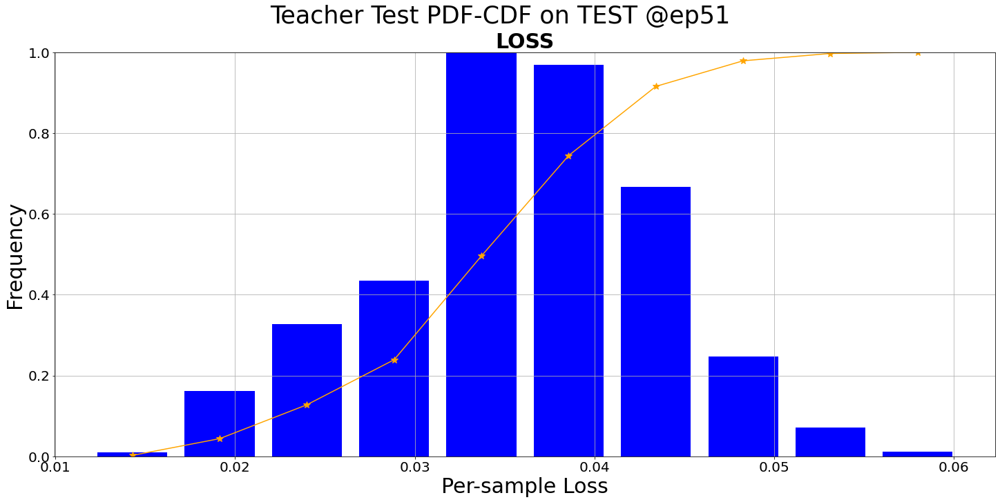

<Figure size 1440x720 with 0 Axes>

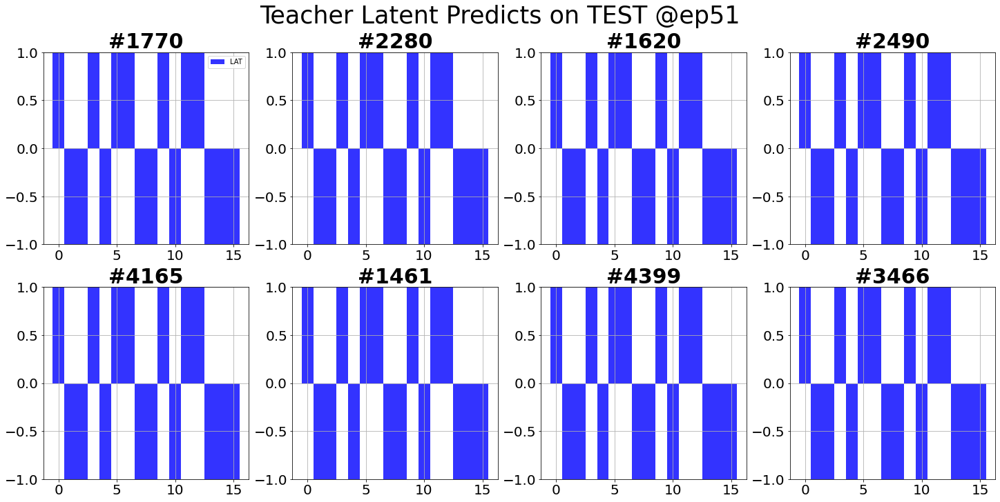

Saving pred including GT, PRED, LAT, IND, TAG...Done

Teacher schedule Completed!


In [58]:
# Training and Testing
%matplotlib inline
tsae_t_trained = TSAE_T_trainer.schedule()

#### Student

In [5]:
csiencoder = TP.CSIEncoder(out_length=16)
imgencoder = tsae_t_trained['imgen']
imgdecoder = tsae_t_trained['imgde']

TSAE_S_trainer = TP.CompTrainerAEStudent(
                              name='Student', mask=False,
    networks=[csiencoder, imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=notion=f'{date}_{run}TSAE')

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 228.04344272613525 sec
Student test: sample=135/137, loss=13121.4092    
Test finished. Average loss={'LOSS': 35028.58438541942, 'IMG': 8795.069570569227}

Total training time: 46.89206504821777 sec


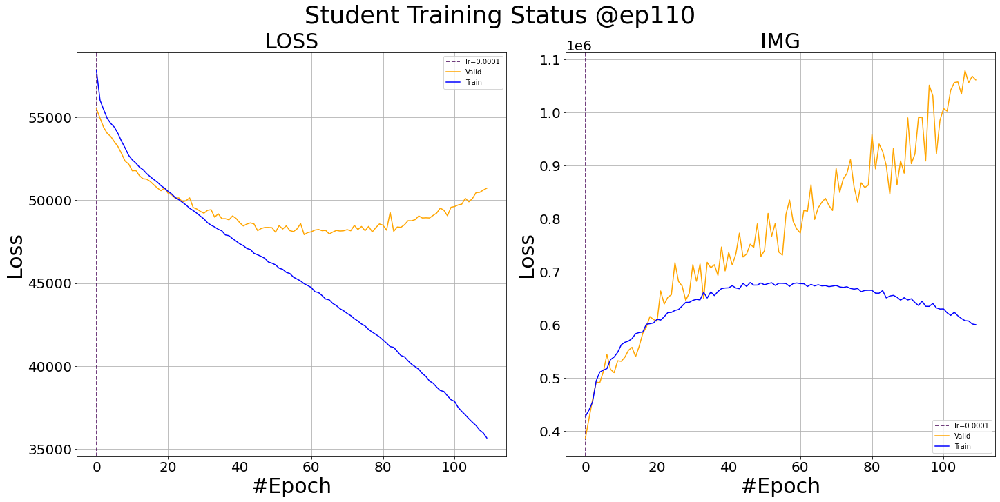

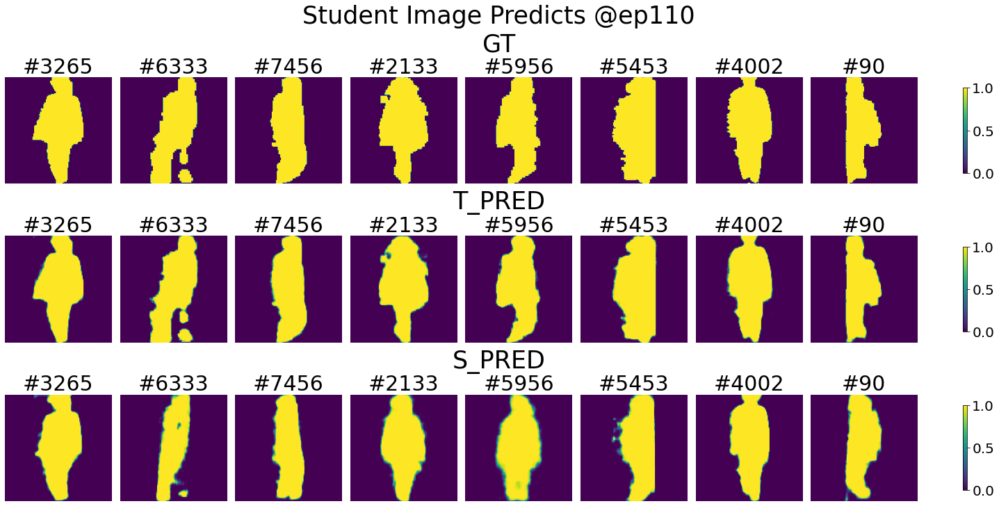

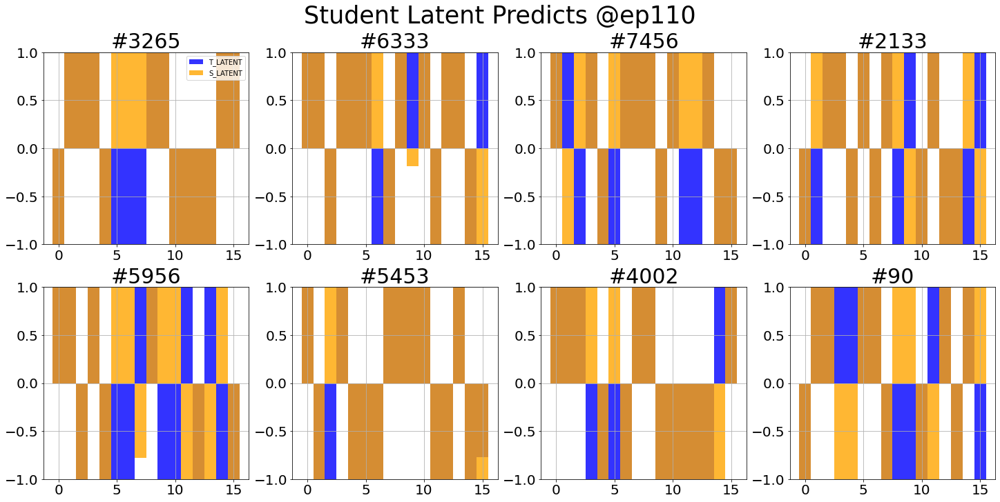

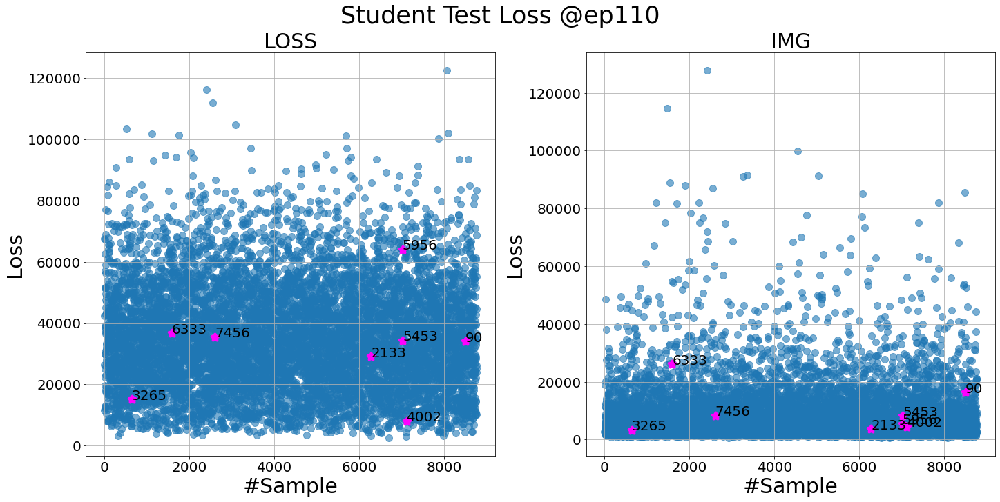

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

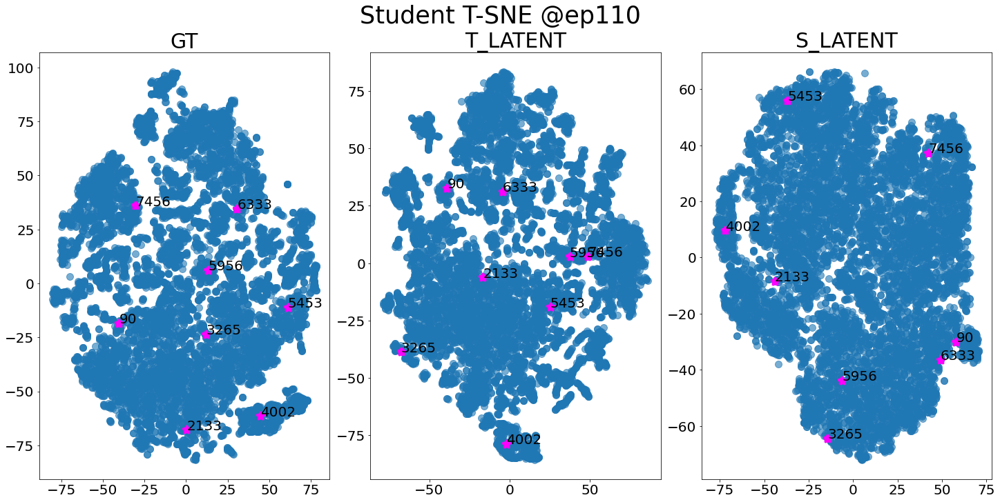

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 238.728182554245 sec
Student test: sample=135/137, loss=23972.2363    
Test finished. Average loss={'LOSS': 33223.76197373606, 'IMG': 8716.30402135501}

Total training time: 47.204394817352295 sec


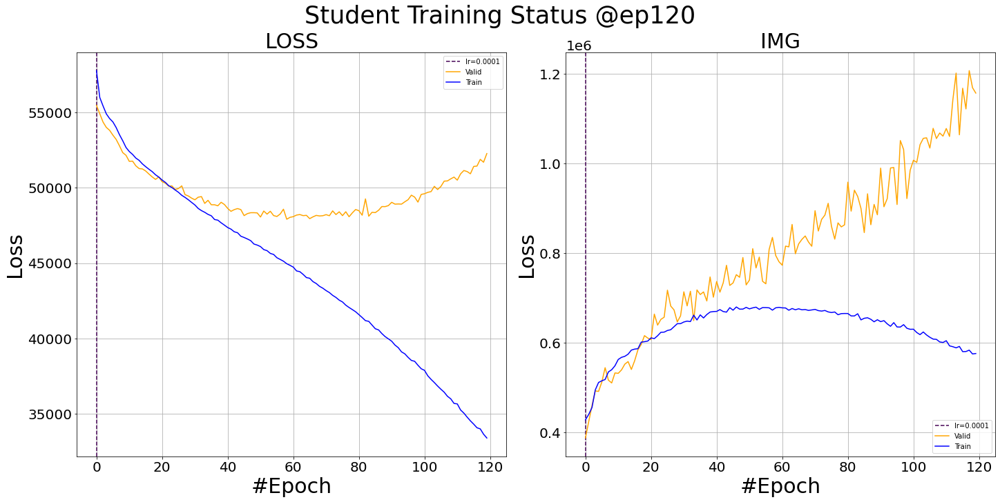

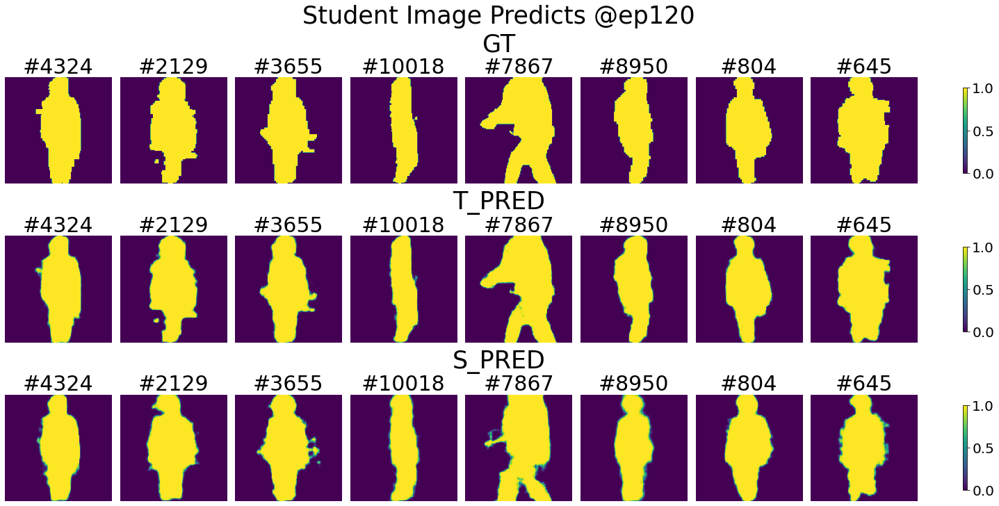

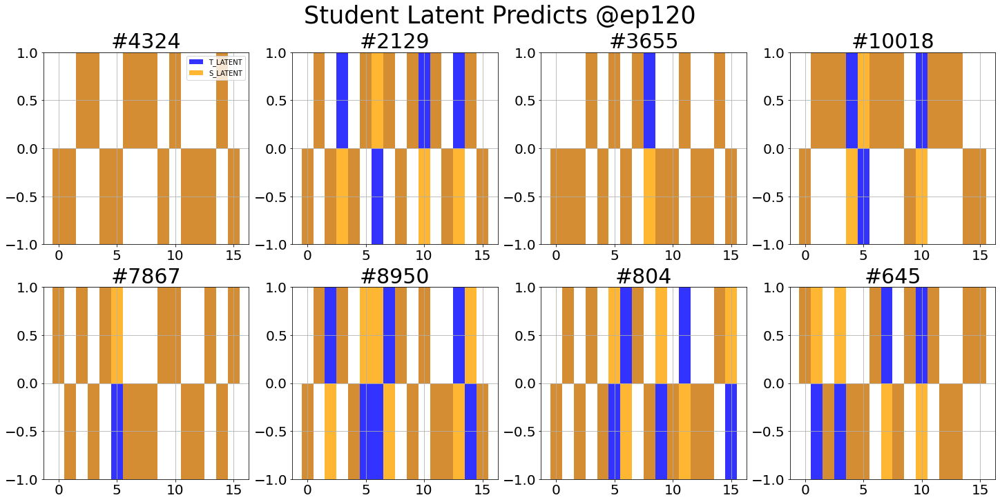

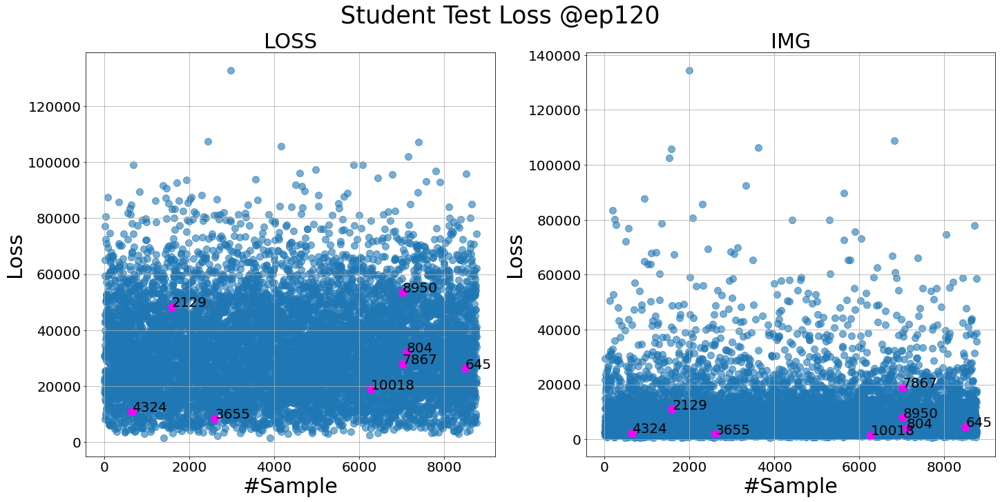

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

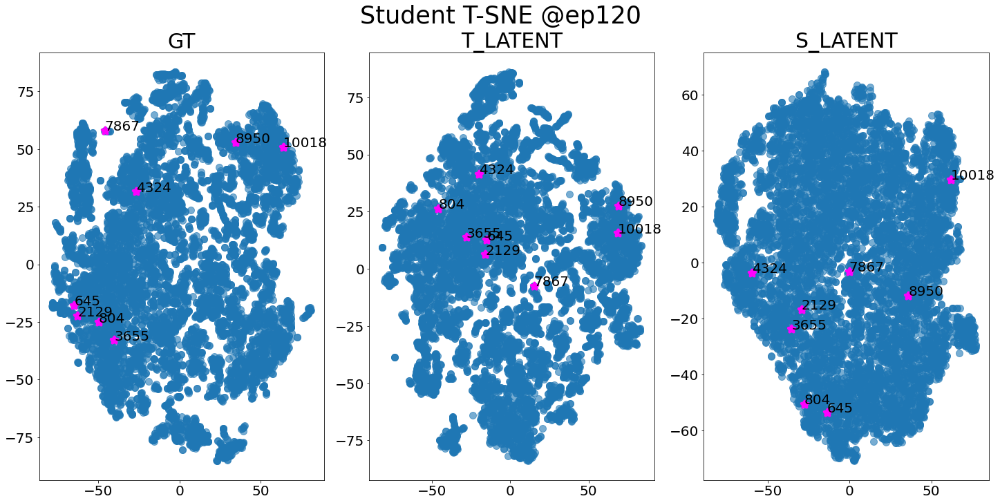

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 238.43113136291504 sec
Student test: sample=135/137, loss=39659.2578    
Test finished. Average loss={'LOSS': 29967.258354270547, 'IMG': 8116.707627540087}

Total training time: 47.11909103393555 sec


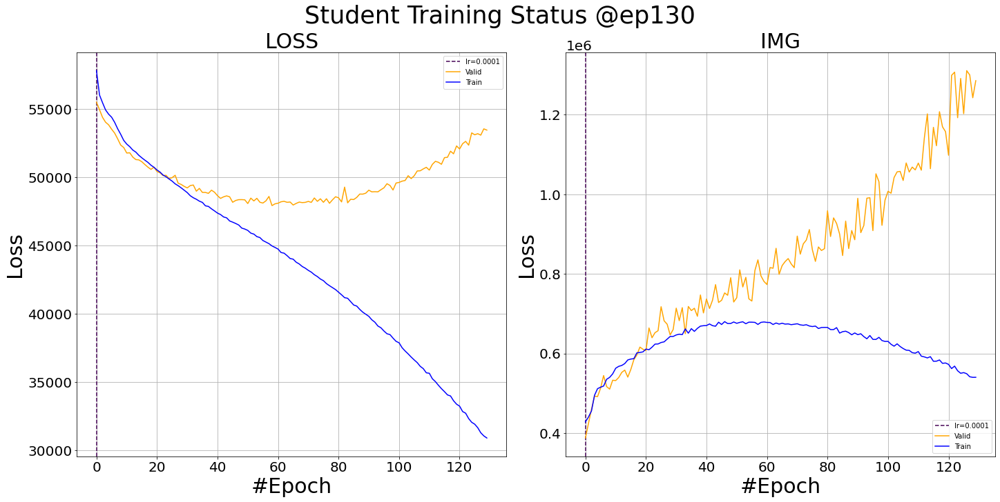

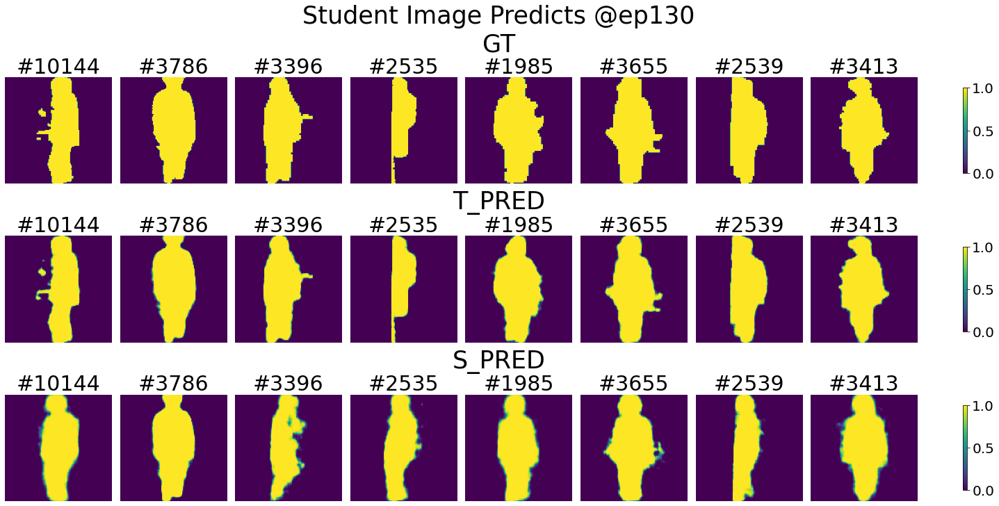

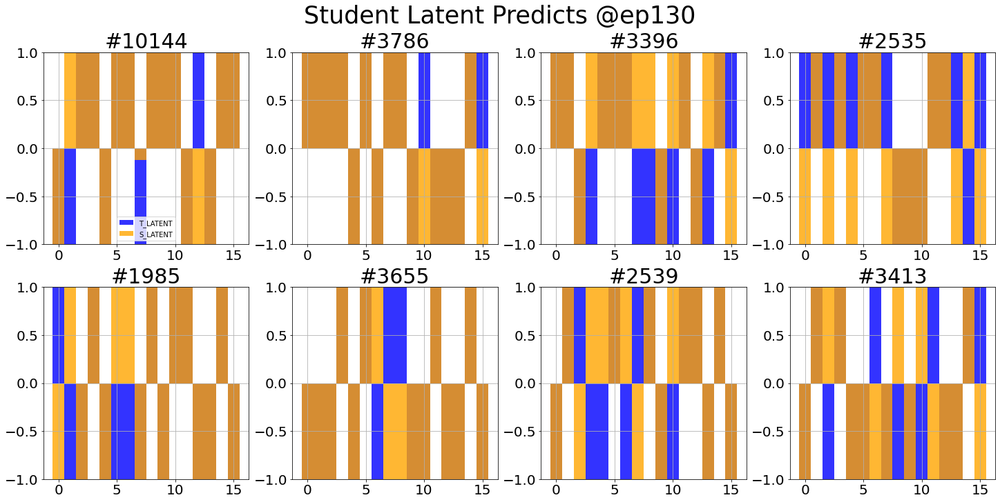

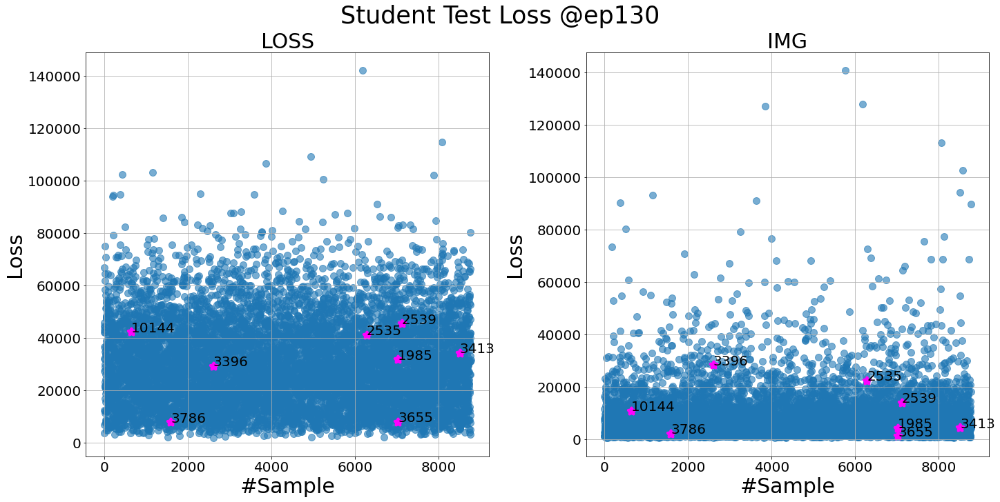

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

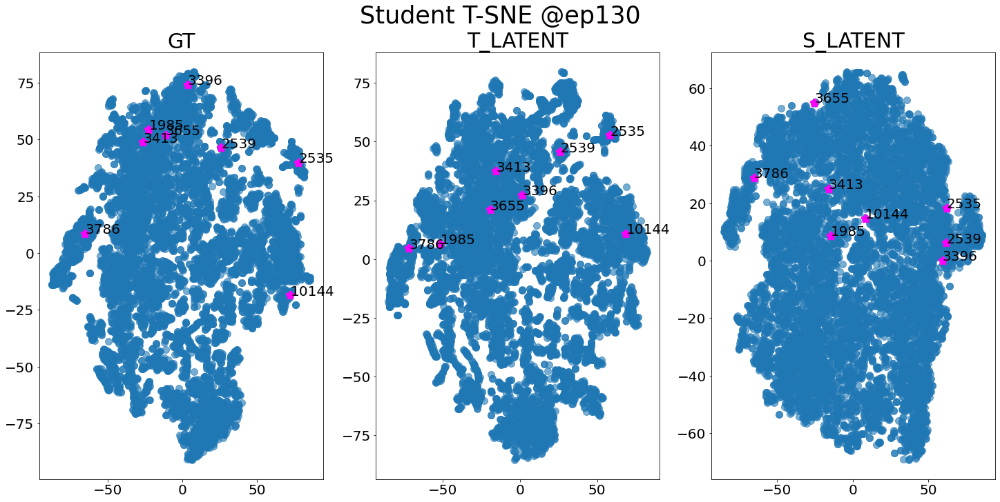

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 233.9625952243805 sec
Student test: sample=135/137, loss=23375.0762    
Test finished. Average loss={'LOSS': 27197.777385057325, 'IMG': 7512.672243810918}

Total training time: 47.31579875946045 sec


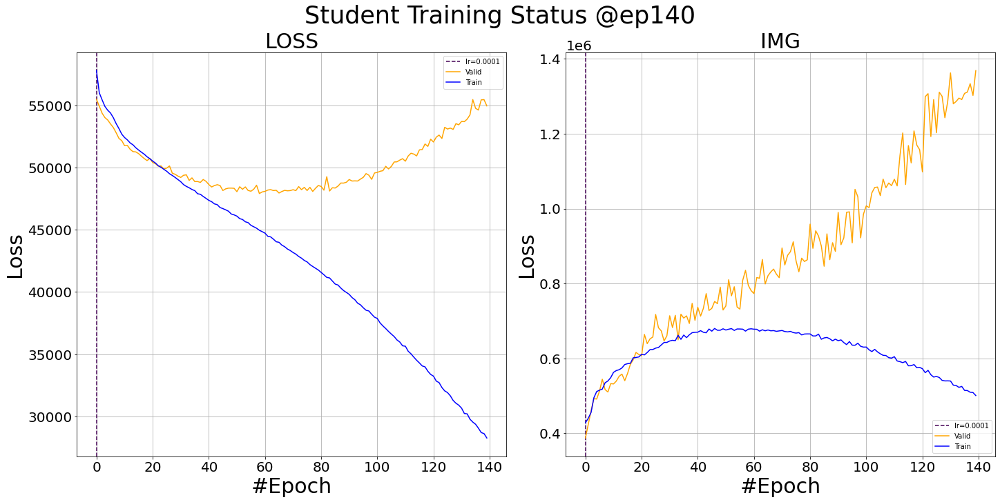

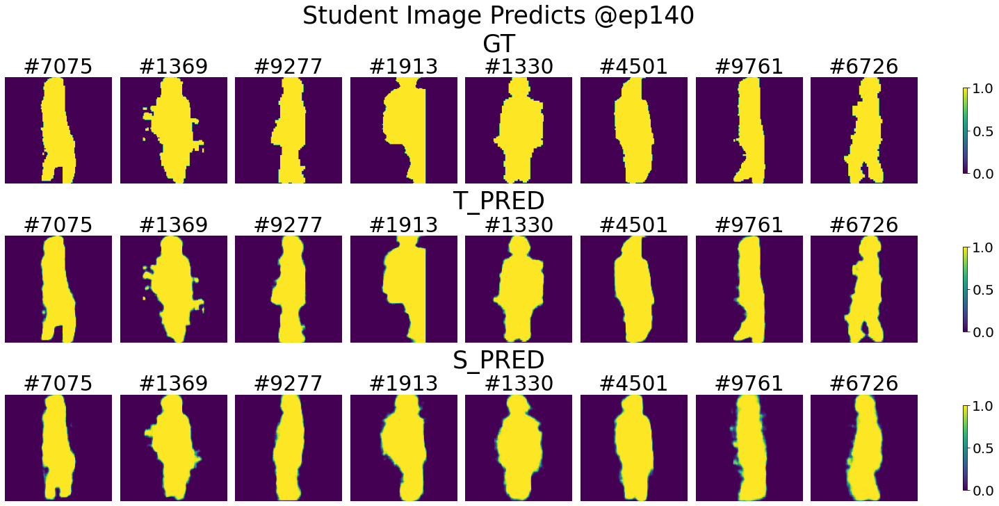

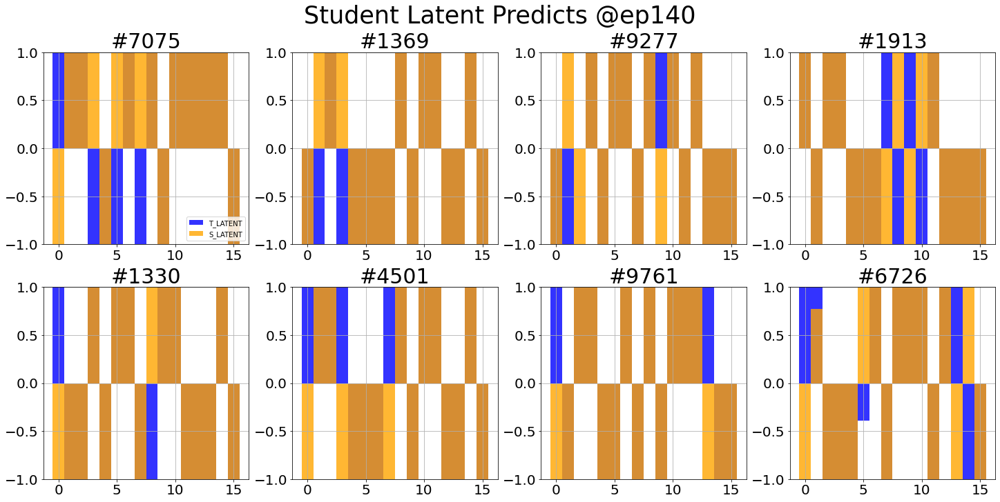

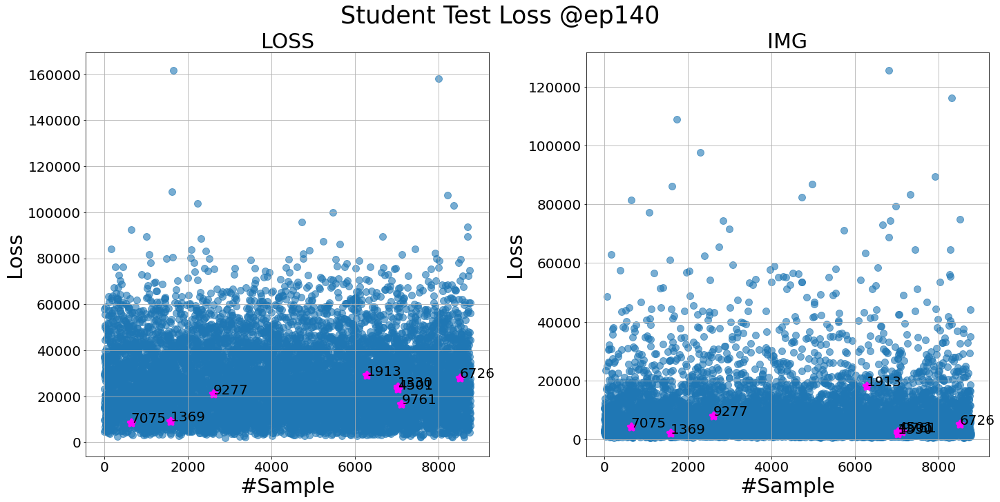

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

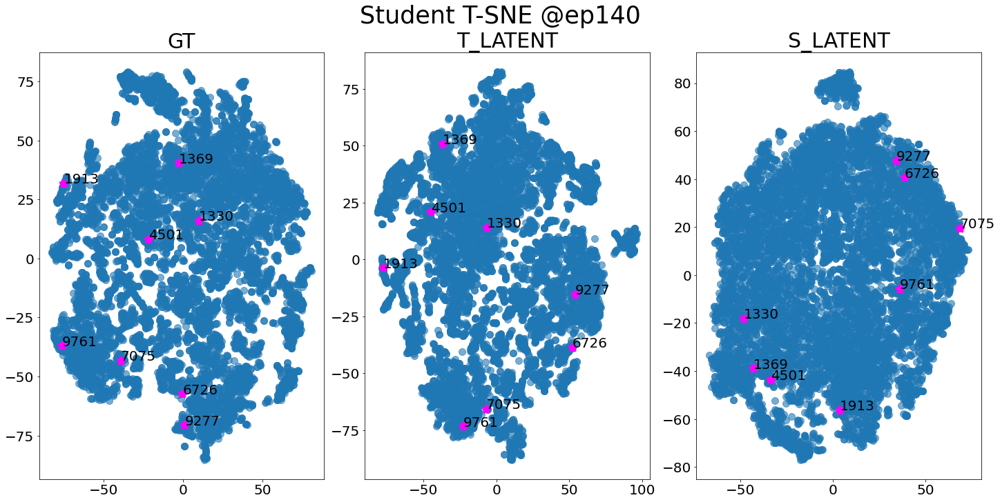

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 239.00614047050476 sec
Student test: sample=135/137, loss=52515.5156    
Test finished. Average loss={'LOSS': 24804.74192214186, 'IMG': 7006.486379860092}

Total training time: 47.59880447387695 sec


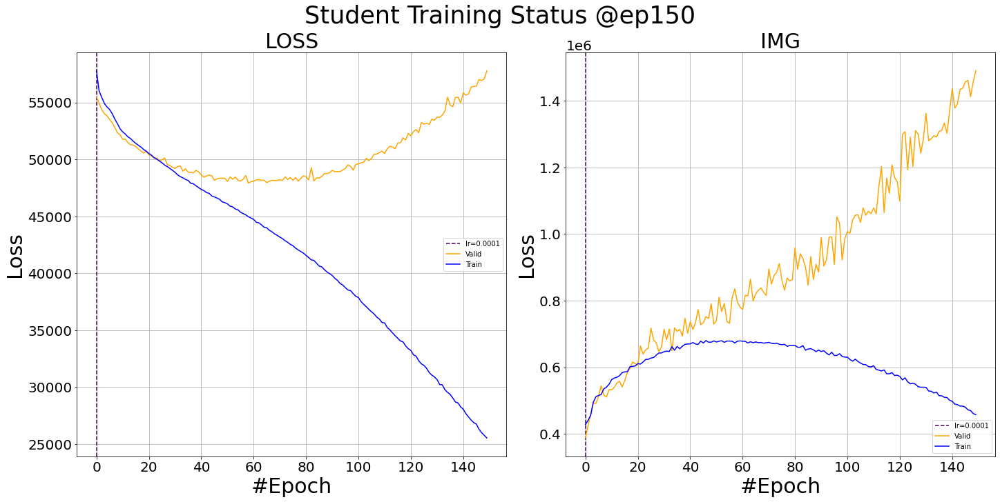

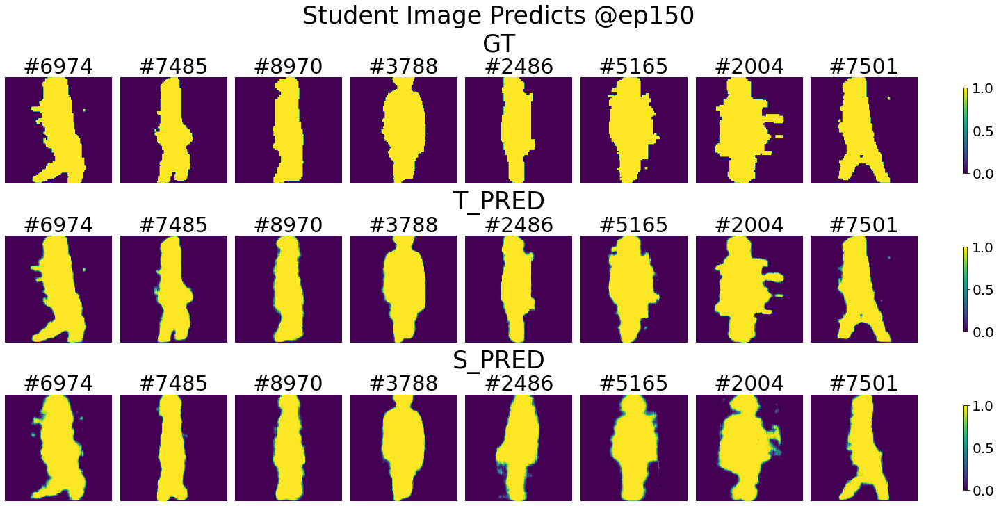

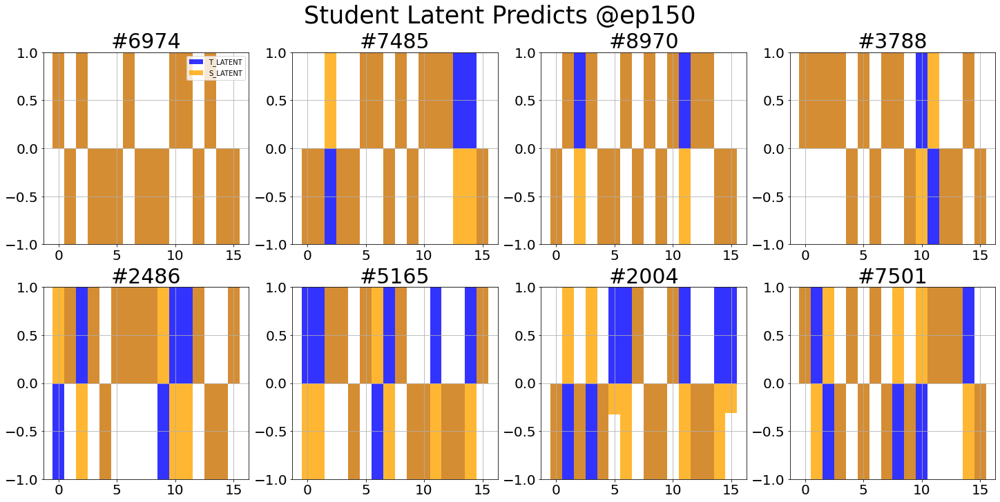

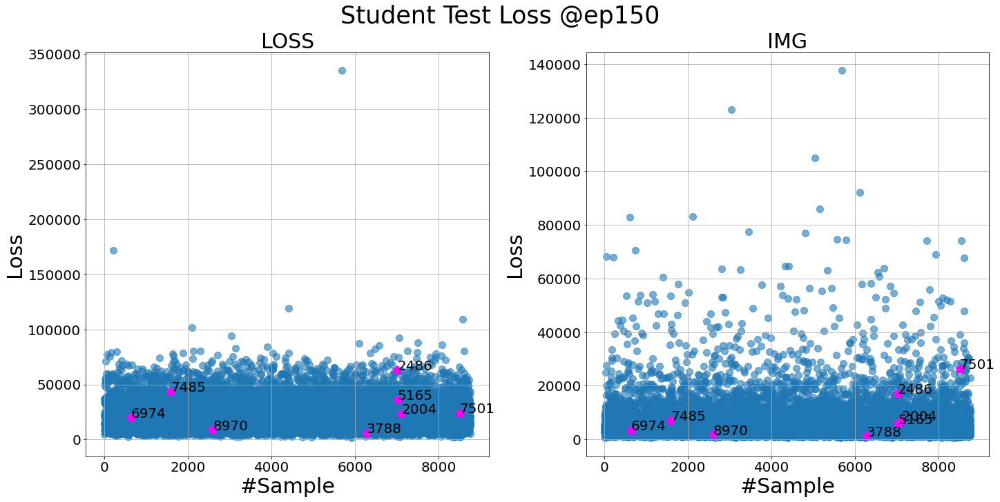

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

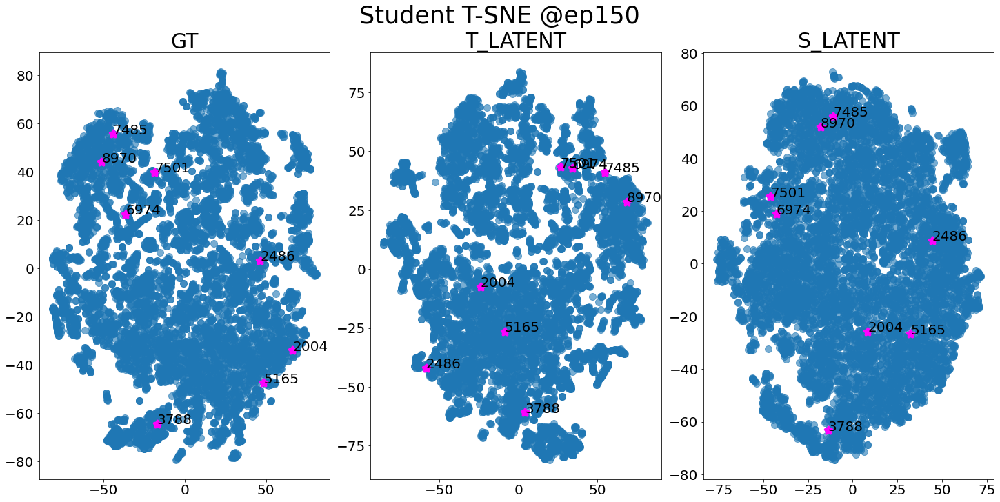

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 270.9500823020935 sec
Student test: sample=135/137, loss=22941.0781    
Test finished. Average loss={'LOSS': 21998.78309021553, 'IMG': 6511.032782540704}

Total training time: 56.045193910598755 sec


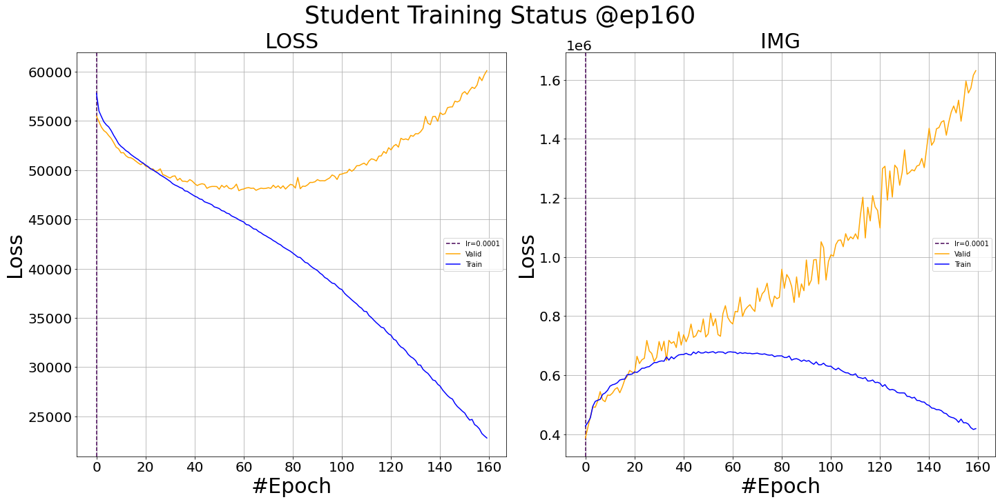

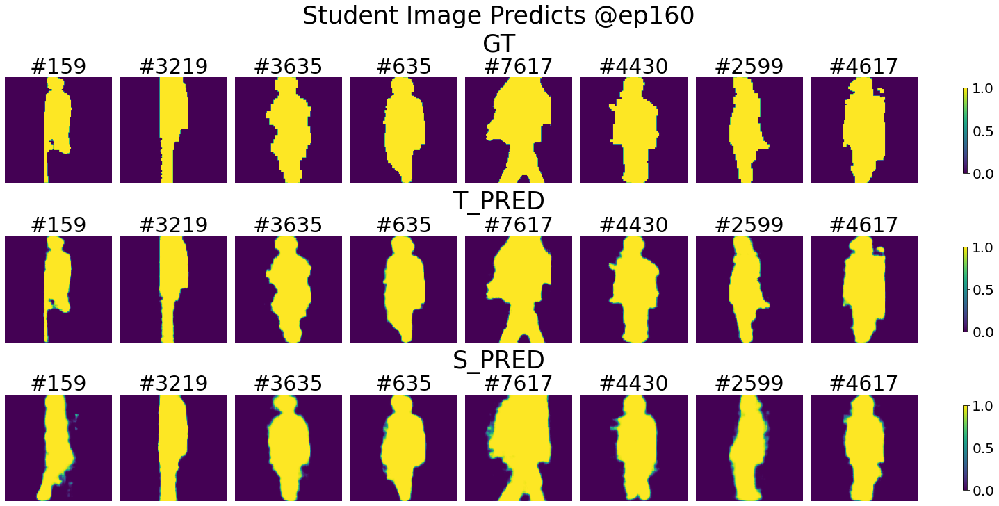

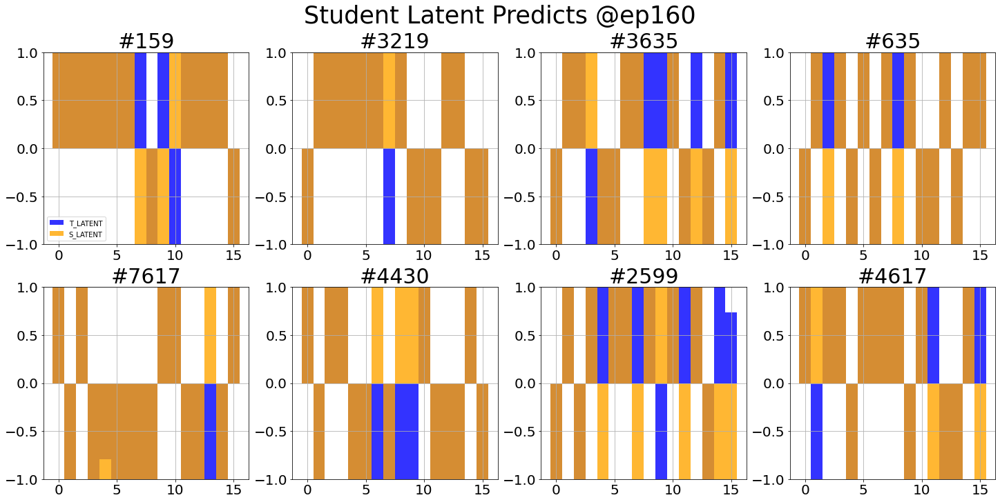

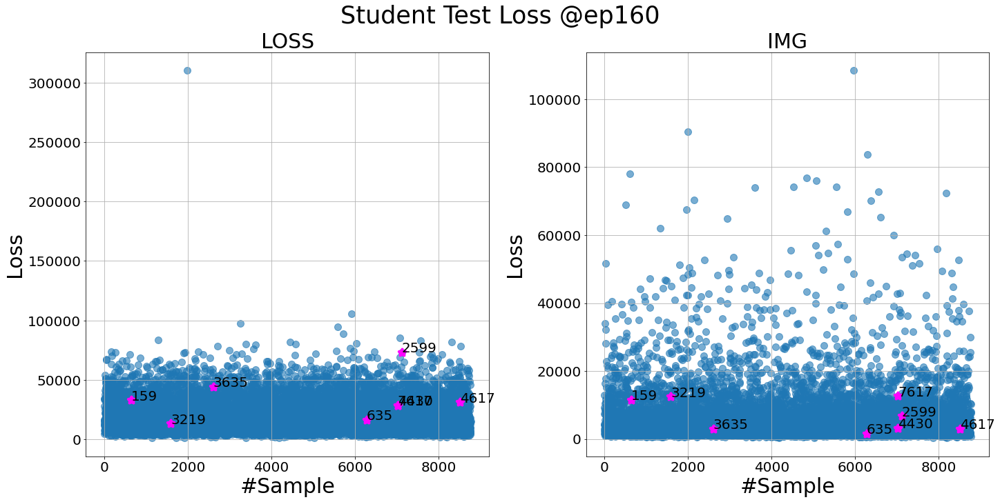

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

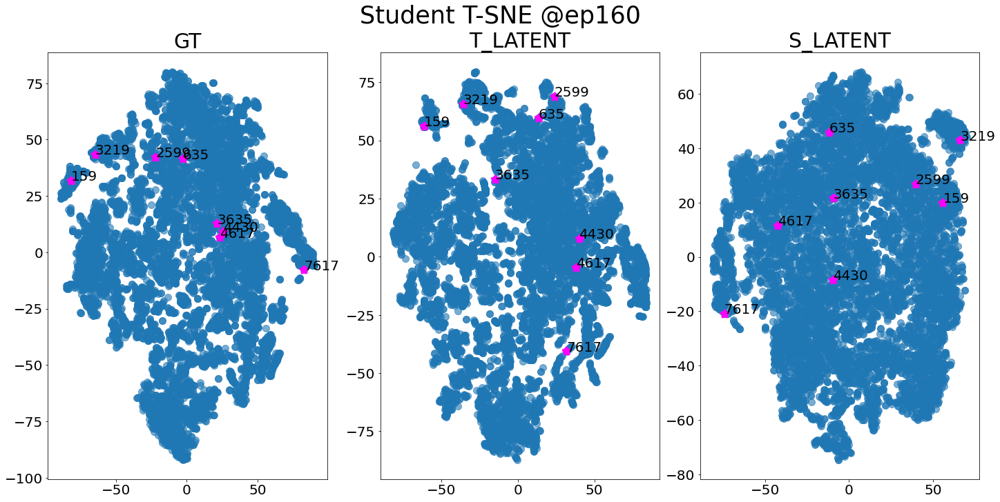

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 273.27590894699097 sec
Student test: sample=135/137, loss=3208.9419    
Test finished. Average loss={'LOSS': 19533.30248041919, 'IMG': 5618.090990063048}

Total training time: 59.18001198768616 sec


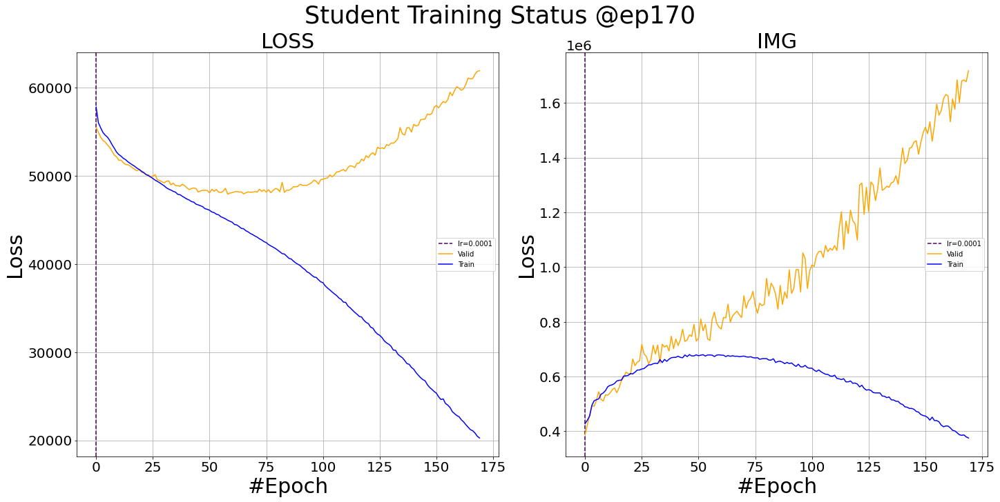

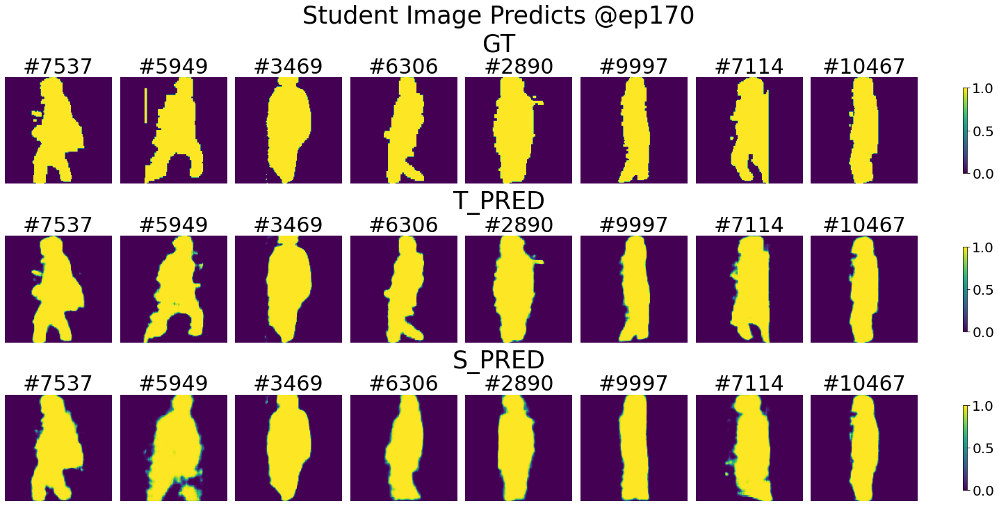

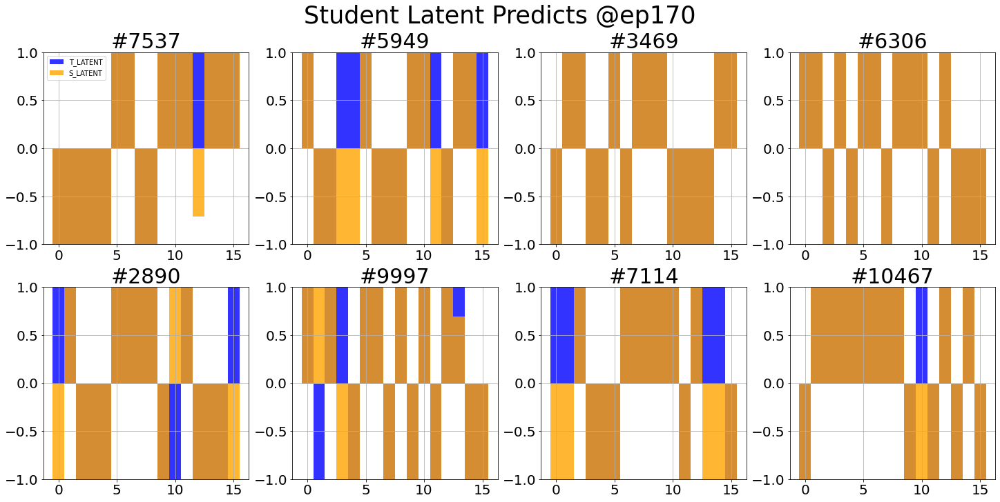

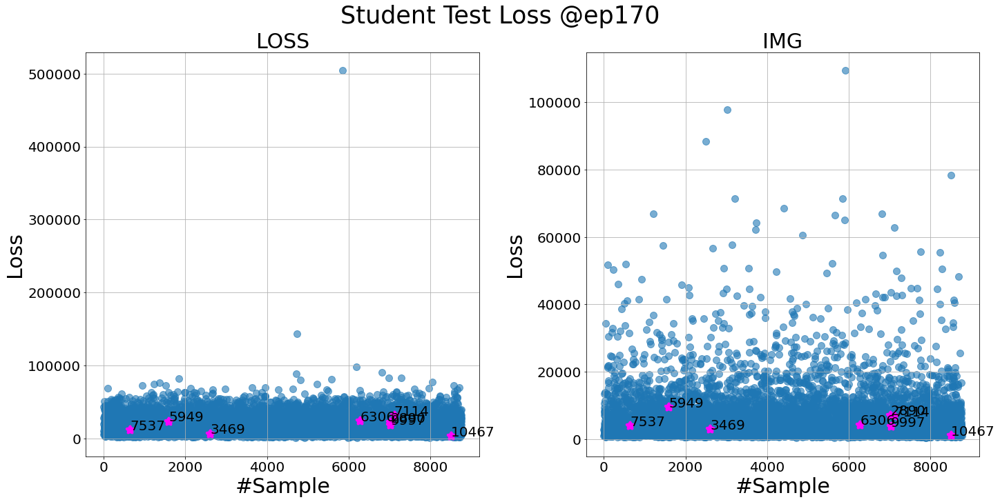

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

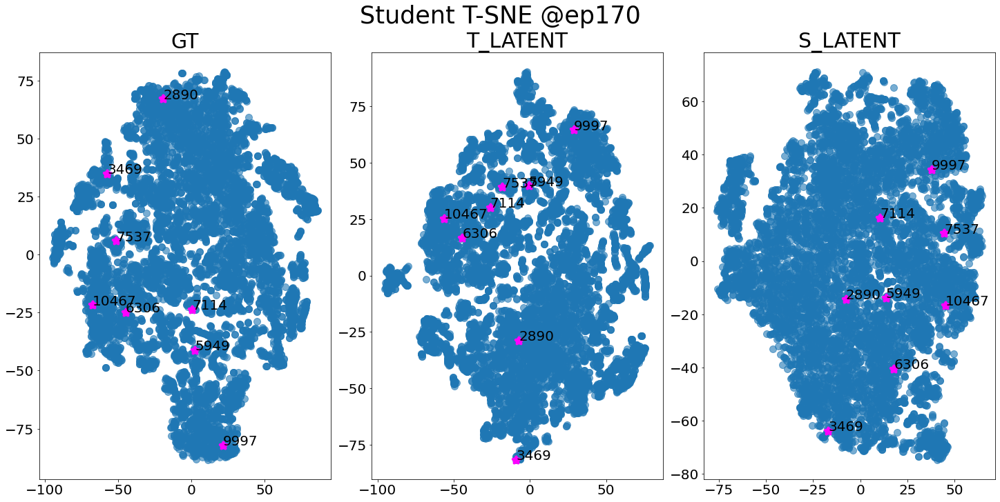

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 281.53487396240234 sec
Student test: sample=135/137, loss=22339.3125    
Test finished. Average loss={'LOSS': 17242.123596330628, 'IMG': 5392.789958960819}

Total training time: 62.942203760147095 sec


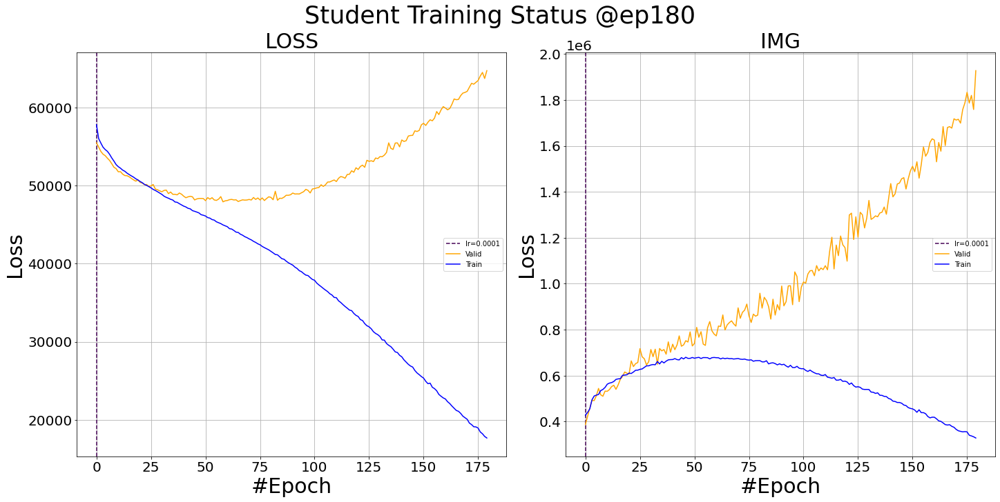

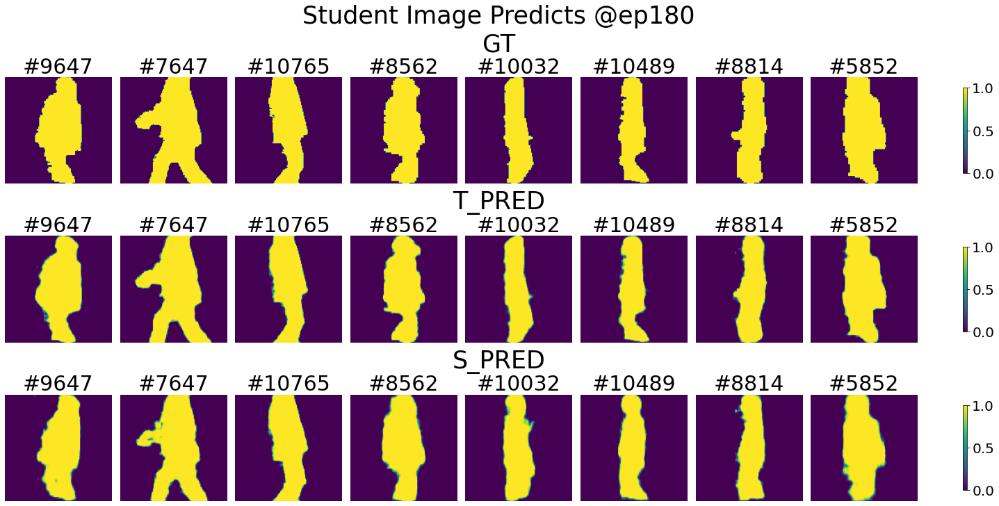

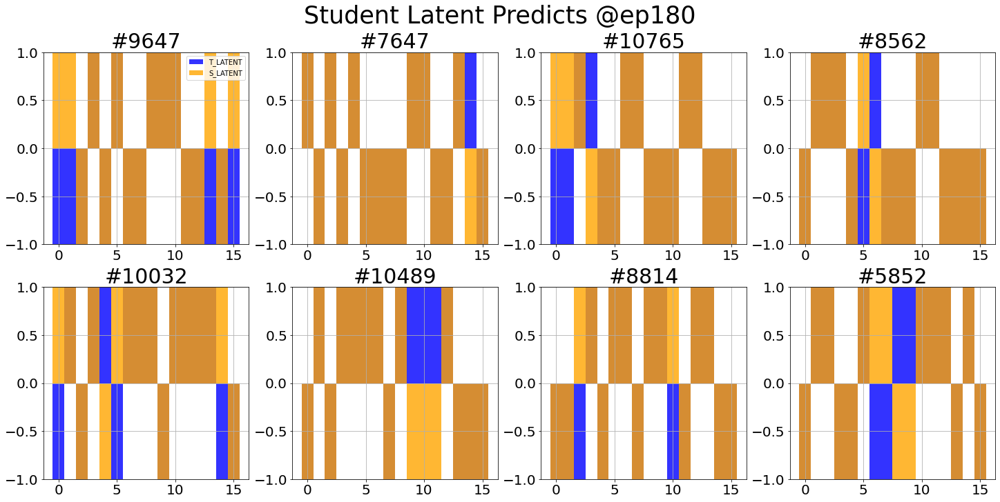

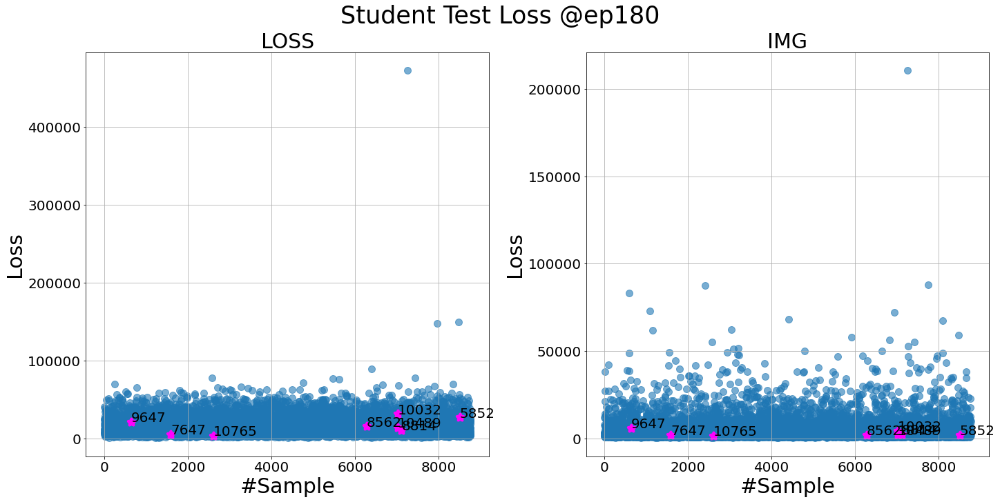

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

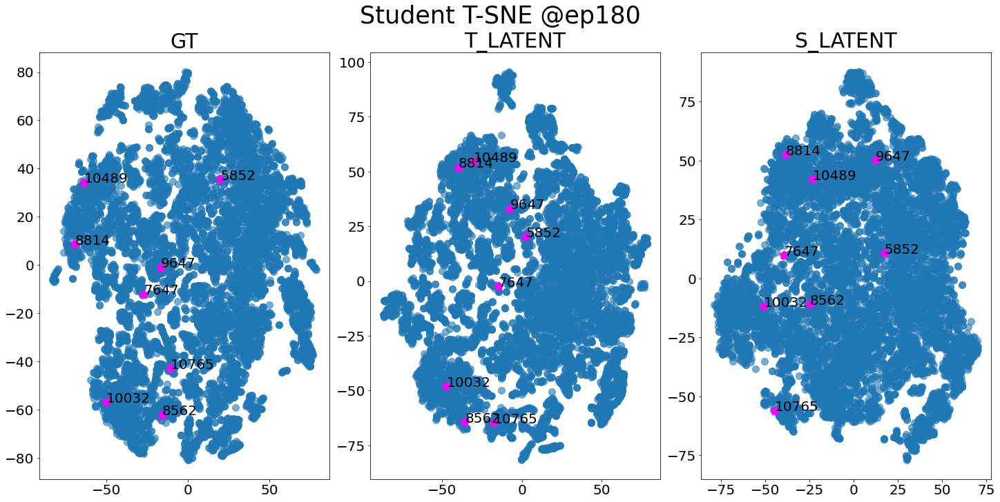

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 272.3234474658966 sec
Student test: sample=135/137, loss=13028.3711    
Test finished. Average loss={'LOSS': 14483.705502600566, 'IMG': 4067.3034043938574}

Total training time: 55.31242609024048 sec


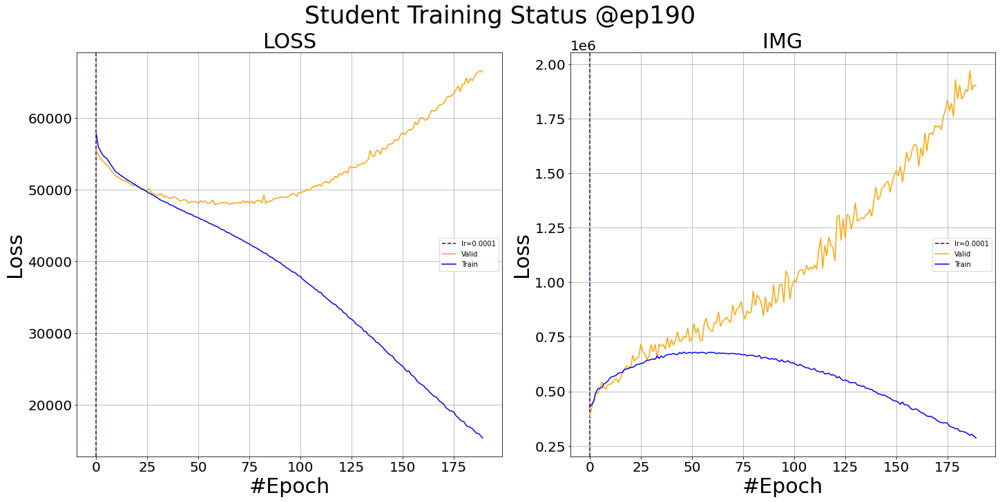

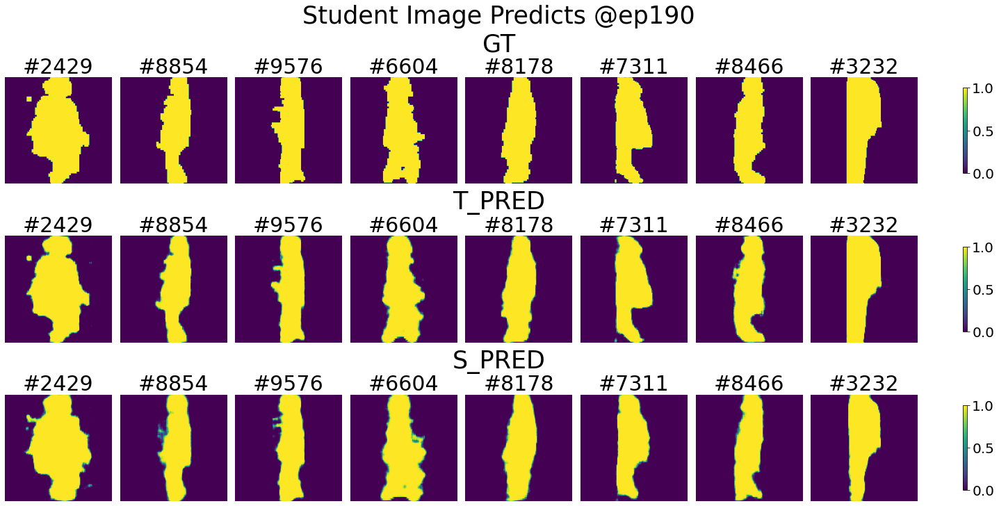

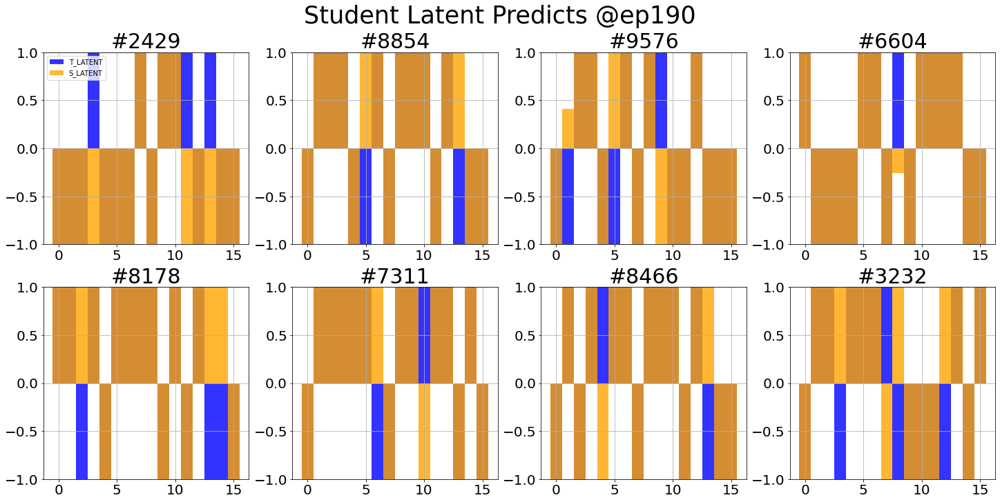

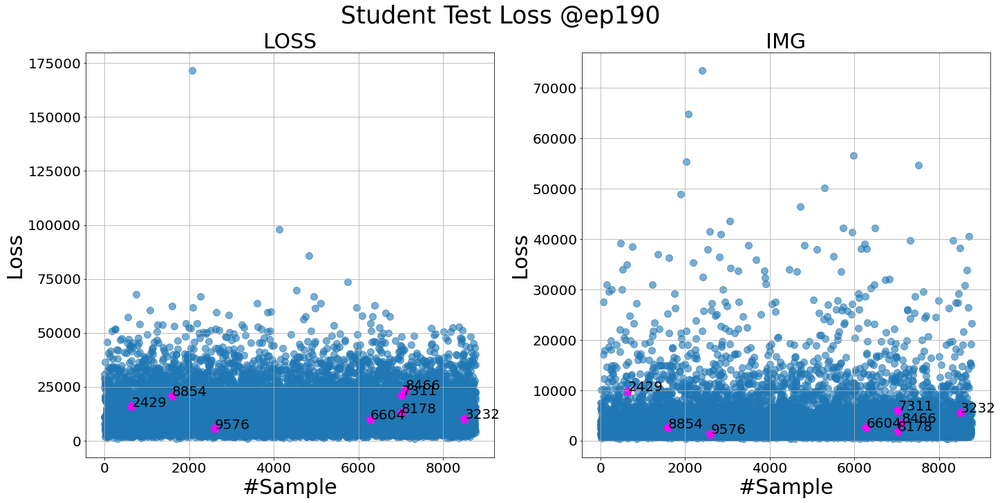

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

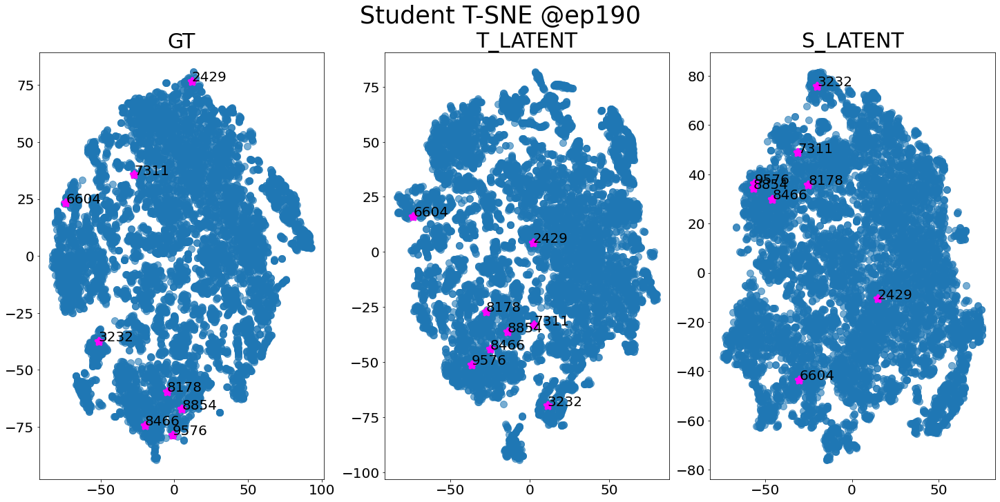

Student valid: epoch=9/10, batch=15/17, current best valid loss=43294.0234        =43294.0234    
Total training time: 235.71003246307373 sec
Student test: sample=135/137, loss=3716.7837     
Test finished. Average loss={'LOSS': 12857.171855884746, 'IMG': 3710.0044336249357}

Total training time: 49.54043221473694 sec


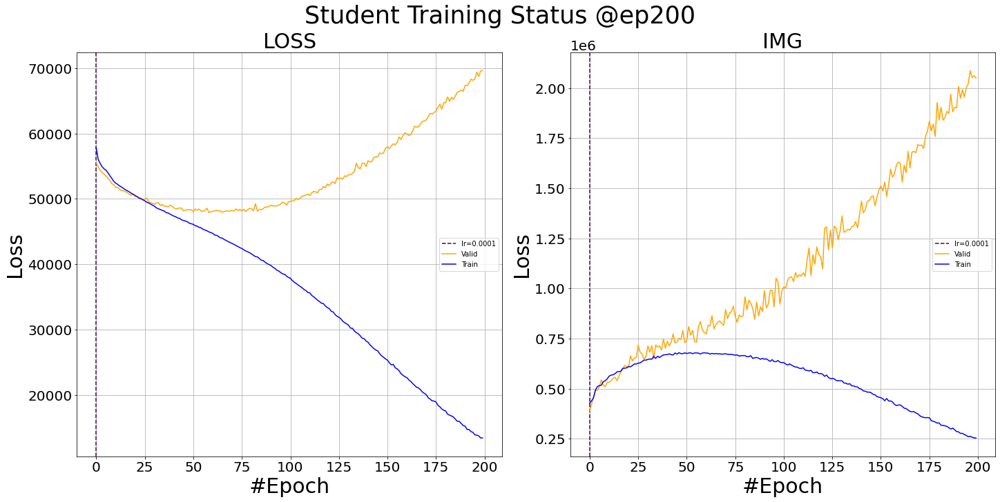

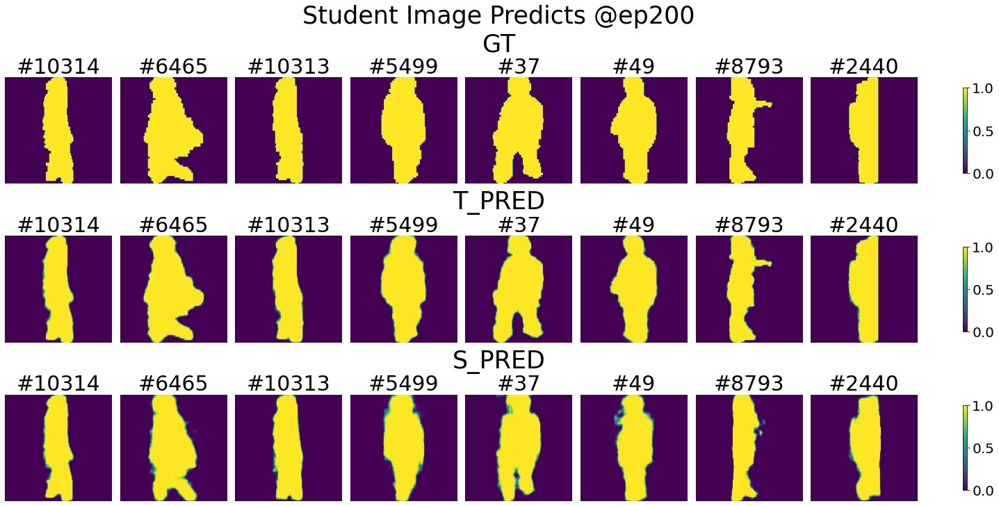

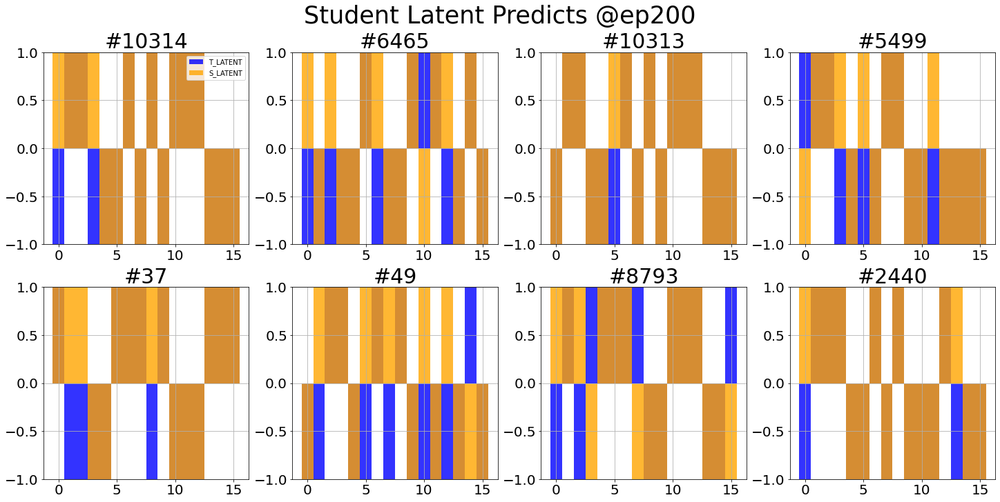

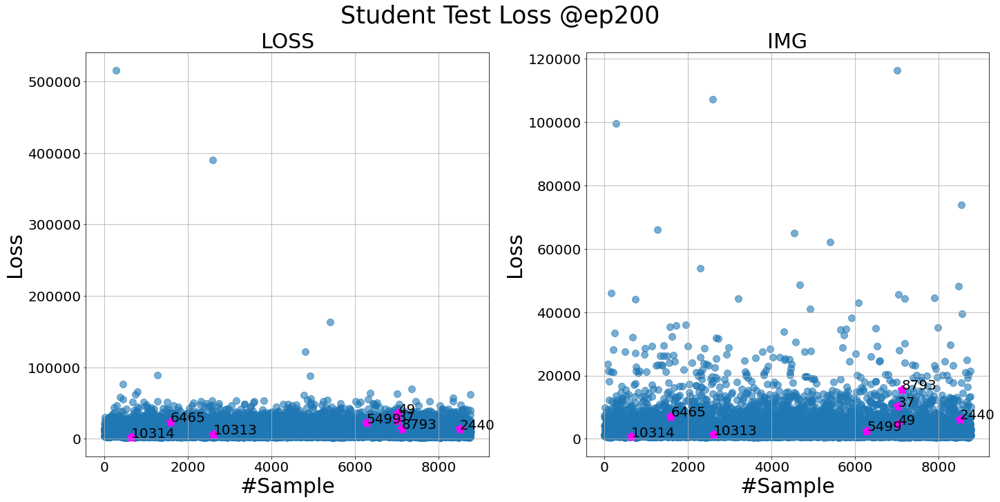

/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/bob/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py

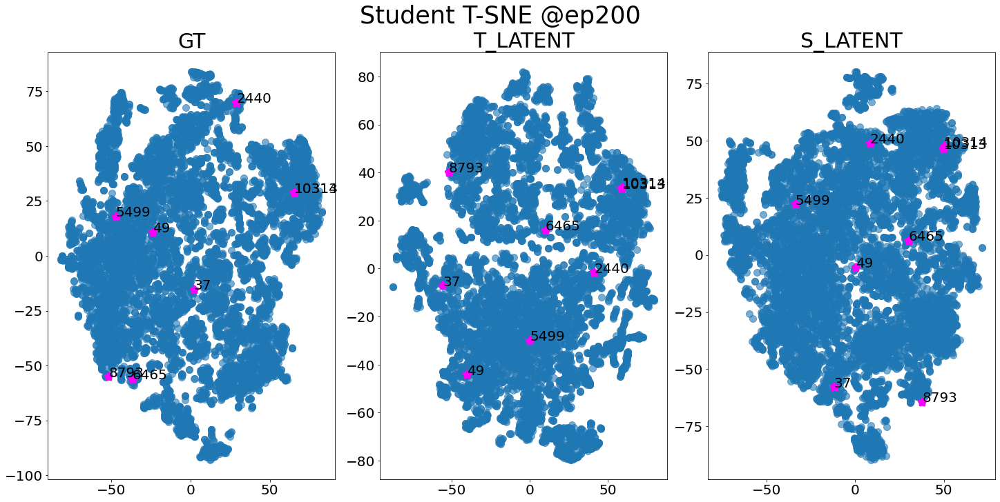


Schedule Completed!


In [7]:
# Training and Testing
%matplotlib inline
tsae_s_trained = TSAE_S_trainer.schedule()

### Teacher-Student VAE

#### Teacher

In [ ]:
import TrainerVTS_V06C1 as TP_TSVAE
torch.cuda.set_device(gpu)
imgencoder = TP_TSVAE.ImageEncoder(latent_dim=16)
imgdecoder = TP_TSVAE.ImageDecoder(latent_dim=16)
TSAE_T_trainer = TP_TSVAE.TeacherTrainer(name='Teacher', mask=False,
                                         networks=[imgencoder, imgdecoder],
                                         lr=1e-4, epochs=10, cuda=gpu,
                                         train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=f'{date}_{run}TSVAE')

In [ ]:
# Training and Testing
%matplotlib inline
tsvae_t_trained = TSVAE_T_trainer.schedule()

#### Student

In [ ]:
csiencoder = TP_TSVAE.CSIEncoder(out_length=16)
imgencoder = tsvae_t_trained['imgen']
imgdecoder = tsvae_t_trained['imgde']

TSAE_S_trainer = TP_TSVAE.StudentTrainer(name='Student', mask=False,
                                         networks=[csiencoder, imgencoder, imgdecoder],
                                         lr=1e-4, epochs=10, cuda=gpu,
                                         train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader, notion=notion=f'{date}_{run}TSVAE')

In [ ]:
# Training and Testing
%matplotlib inline
tsvae_s_trained = TSVAE_S_trainer.schedule()